In [1]:
import sys
import subprocess

#import pkg_resources
#required = {'harmonypy','sklearn','scanpy','pandas', 'numpy', 'bbknn', 'scipy', 'matplotlib', 'seaborn' ,'scipy'}
#installed = {pkg.key for pkg in pkg_resources.working_set}
#missing = required - installed
#if missing:
#    print("Installing missing packages:" )
#    print(missing)
#    python = sys.executable
#    subprocess.check_call([python, '-m', 'pip', 'install', *missing], stdout=subprocess.DEVNULL)

%matplotlib inline
from collections import Counter
from collections import defaultdict
import scanpy as sc
import pandas as pd
import pickle as pkl
import numpy as np
from bbknn import bbknn
import scipy
import matplotlib.pyplot as plt
import re
import glob
import os
import sys
from geosketch import gs
from numpy import cov
import scipy.cluster.hierarchy as spc
import seaborn as sns; sns.set(color_codes=True)
from sklearn.linear_model import LogisticRegression
import sklearn
import harmonypy as hm
from pathlib import Path

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis')

# LR script

# Only block to edit in LR script

In [2]:
# Introduce variables
# Note that this script expects raw data to be in "non-batch-corrected" adata.raw.X. 

# Required: Introduce the path you'd like to save figures or data to 
save_path = "/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/LR_human_gastrulation_ys/"

# Required: Name of first object
data1 = "_gastrulation"
# Provide path to obj1 // landscape/training data
Object1 = "/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_data/gastrulation_data_human_210521/A1_V1_human_gastrulation_raw.h5ad"
#Object1 = '/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_data/gastrulation_data_human_210521/A1_V2_human_gastrulation_with_sub_cat_raw.h5ad'
# Provide categorical to join between datasets
cat1 = "celltype_origin"

# Required: Name of second object
data2 = "_ys"
# Provide path to obj2 // prediction/projection data
Object2 = "/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_data/A4_V7_YS_integrated_data_singlets_with_raw_counts_for_MS_plotting_20211111_with_obsp.h5ad"
# Provide categorical to join between datasets
cat2 = "cell.labels"

# Required: LR Model Options
penalty='elasticnet' # can be ["l1","l2","elasticnet"]
sparcity=0.2
max_iter = 200 #Increase if experiencing max iter issues
l1_ratio = 0.1 #If using elasticnet, tis controls the ratio between l1 and l2

# Optional: Batch correction options (this is for correction of eventual combined dataset for data1 and data2)
# If you do not have a batch variable for either data1 or data2, please add a "filler" column in the relevent adata.obs
# for the purposes of batch_correction and batch args below.
# e.g., adata.obs["whatever"] = "something"; batch="whatever"
batch_correction = "Harmony" # Will accept Harmony, BBKNN or False as options
batch = ["tissue","fetal.ids",] # Will accept any batch categorical. Comma space a batch categorical for each dataset. Position 1 is for data1, position 2 is for data2

# Optional: miscellaneous Options.   
subsample_train = False # Samples the training data to the smallest fraction (highly dependent on resolution of input celltype categorical). This corrects for proportional differences between celltype labels of interest in the training data. E.g., training data has 50,000 B cells, 20,000 T cells and 100 HSCs. This function will subsample all training to 100 cells per cell type. 
subsample_prop = 0.2 # Give this option a proprtion to subsample to(e.g 0.2), if NA given, will subsample to smallest population
subsample_predict = False
subsample_prop_predict = 0.5
remove_non_high_var = True

train_x = 'X_pca' # Define the resource to train and predict on, PCA, X or UMAP (#if you wish to use gene expression, train_x = 'X')
remove_effect_of_custom_gene_list = 'NA' # "./cell_cycle_genes.csv" #remove a custom list of genes from just the variable genes to compute PCA from. Your .csv should have HGNC gene names in the first column to be read in as a vector, any column name is fine.
use_raw = True # Do you want to use adata.raw.X (recommended)

In [3]:
#crs_tbl.to_csv('./211121_med_lr_probs.csv')

In [4]:
#pred_out.to_csv('./211121_predicted_lr_probs.csv')

In [5]:
#adata.write('./human_gastrula_ys_integrated_211121.h5ad')

# Relabel data

In [74]:
cells = ['Blood Progenitors_Yolk Sac_0_gastrulation',
 'Blood Progenitors_Yolk Sac_1_gastrulation',
 'Blood Progenitors_Yolk Sac_2_gastrulation',
 'DE(NP)_gastrulation',
 'DE(P)_gastrulation',
 'Erythro-Myeloid Progenitors_Yolk Sac_0_gastrulation',
 'Erythro-Myeloid Progenitors_Yolk Sac_1_gastrulation',
 'Erythro-Myeloid Progenitors_Yolk Sac_2_gastrulation',
 'Erythroblasts_Yolk Sac_gastrulation',
 'Hemogenic Endothelium_Yolk Sac_0_gastrulation',
 'Hemogenic Endothelium_Yolk Sac_1_gastrulation',
 'Hypoblast_gastrulation',
 'Myeloid Progenitors_Yolk Sac_gastrulation',
 'YS Endoderm_Yolk Sac_gastrulation',
 'YS Mesoderm_Yolk Sac_gastrulation']

predicted = [
'MK_lineage_Yolk Sac_gastrulation',
'Early_Erythroid_Yolk Sac_gastrulation',
'MK_lineage_Yolk Sac_gastrulation',
 'Definitive_Endoderm_gastrulation',
 'Definitive_Endoderm(Proliferating)_gastrulation',
 'HSPC_lineage_Yolk Sac_gastrulation',
 'HSPC_lineage_Yolk Sac_gastrulation',
 'Macrophage_lineage_Yolk Sac_gastrulation',
 'Erythroid_Yolk Sac_gastrulation',
 'Hemogenic Endothelium_Yolk Sac_gastrulation',
 'HSPC_lineage_Yolk Sac_gastrulation',
 'Hypoblast_gastrulation',
'Macrophage_lineage_Yolk Sac_gastrulation',
 'YS Endoderm_Yolk Sac_gastrulation',
 'YS Mesoderm_Yolk Sac_gastrulation']
mapper = dict(zip(cells,predicted))

In [75]:
mapper

{'Blood Progenitors_Yolk Sac_0_gastrulation': 'MK_lineage_Yolk Sac_gastrulation',
 'Blood Progenitors_Yolk Sac_1_gastrulation': 'Early_Erythroid_Yolk Sac_gastrulation',
 'Blood Progenitors_Yolk Sac_2_gastrulation': 'MK_lineage_Yolk Sac_gastrulation',
 'DE(NP)_gastrulation': 'Definitive_Endoderm_gastrulation',
 'DE(P)_gastrulation': 'Definitive_Endoderm(Proliferating)_gastrulation',
 'Erythro-Myeloid Progenitors_Yolk Sac_0_gastrulation': 'HSPC_lineage_Yolk Sac_gastrulation',
 'Erythro-Myeloid Progenitors_Yolk Sac_1_gastrulation': 'HSPC_lineage_Yolk Sac_gastrulation',
 'Erythro-Myeloid Progenitors_Yolk Sac_2_gastrulation': 'Macrophage_lineage_Yolk Sac_gastrulation',
 'Erythroblasts_Yolk Sac_gastrulation': 'Erythroid_Yolk Sac_gastrulation',
 'Hemogenic Endothelium_Yolk Sac_0_gastrulation': 'Hemogenic Endothelium_Yolk Sac_gastrulation',
 'Hemogenic Endothelium_Yolk Sac_1_gastrulation': 'HSPC_lineage_Yolk Sac_gastrulation',
 'Hypoblast_gastrulation': 'Hypoblast_gastrulation',
 'Myeloid Prog

In [76]:
adata_key.obs['corr_concat'] = adata_key.obs['corr_concat'].astype(str)
#adata_annots.obs['corr_concat'] = adata_annots.obs['corr_concat'] + '_gastrulation'
adata_key.obs['clus_prediction'] = adata_key.obs['corr_concat'].map(mapper)

Trying to set attribute `.obs` of view, copying.


In [77]:
adata_key.obs['clus_prediction']

SS.sc7785290                   MK_lineage_Yolk Sac_gastrulation
SS.sc7785398                  YS Mesoderm_Yolk Sac_gastrulation
SS.sc7785611                  YS Endoderm_Yolk Sac_gastrulation
SS.sc7785425                  YS Mesoderm_Yolk Sac_gastrulation
SS.sc7785599                  YS Endoderm_Yolk Sac_gastrulation
                                     ...                       
SS.sc7786002    Definitive_Endoderm(Proliferating)_gastrulation
SS.sc7786796    Definitive_Endoderm(Proliferating)_gastrulation
SS.sc7786732                   Definitive_Endoderm_gastrulation
SS.sc7785486    Definitive_Endoderm(Proliferating)_gastrulation
SS.sc7786714    Definitive_Endoderm(Proliferating)_gastrulation
Name: clus_prediction, Length: 294, dtype: object

In [82]:
adata.obs['subclusters'] = adata.obs[cat2]

In [78]:
adata.obs['corr_concat'] = adata.obs['corr_concat'].astype(str)
adata.obs.loc[adata.obs['tissue'].isin(['gastrulation']),'corr_concat'] = adata_key.obs.loc[adata_key.obs['tissue'].isin(['gastrulation']),'clus_prediction']

In [ ]:
adata

In [83]:
adata.write('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/LR_human_gastrulation_ys/human_gastrula_ys_integrated_211121.h5ad')

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'corr_concat' as categorical


In [84]:
adata.obs['corr_concat'].value_counts()

Erythroid_ys                                       54436
Macrophage_ys                                      34343
Fibroblast_ys                                      19125
Smooth_Muscle_ys                                    4704
Endoderm_ys                                         4523
MK_ys                                               2154
HSPC_1_ys                                           1884
Mesothelium_ys                                      1764
Microglia_ys                                        1678
Sinusoidal_EC_ys                                    1370
Immature_EC_ys                                      1168
VWF_EC_ys                                           1079
AEC_ys                                              1049
HSPC_2_ys                                            713
Lymphoid_progenitor_ys                               632
Prolif_Sinusoidal_EC_ys                              613
MEMP_ys                                              468
Early_Erythroid_ys             

In [4]:
adata = sc.read('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/LR_human_gastrulation_ys/human_gastrula_ys_integrated_211121.h5ad')

# Use broad labels for plot

In [5]:
meta = pd.read_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/resources/A2_V7_YS_main_metadata_161121.csv',index_col = 0)

In [6]:
meta.columns

Index(['cell.labels', 'stage', 'lanes', 'sex', 'sort.ids', 'fetal.ids',
       'component', 'broad_cell.labels', 'sequencing.type', 'orig.dataset',
       'broad_cell_labels_organ', 'tissue', 'V6_old_indexes',
       'V5_old_indexes'],
      dtype='object')

In [7]:
meta = pd.read_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/resources/A2_V7_YS_main_metadata_161121.csv',index_col = 0)
meta['corr_concat'] = meta['broad_cell.labels'].astype(str) + '_' + 'ys'
adata.obs['corr_concat']= adata.obs['corr_concat'].astype(str) 
adata.obs.loc[adata.obs.index.isin(meta.index),'corr_concat'] = meta.loc[meta.index.isin(adata.obs.index),'corr_concat']

In [8]:
meta['corr_concat'].value_counts()

Erythroid_ys                 54849
Macrophage_ys                34399
Fibroblast_ys                19125
Endothelium_ys                5502
Smooth_Muscle_ys              4704
Endoderm_ys                   4523
Progenitors_ys                4109
MK_ys                         2154
Mesothelium_ys                1764
Microglia_ys                  1678
Monocyte_ys                    591
DC_ys                          546
Granulocyte_precursors_ys      288
Mast_cell_ys                   278
Lymphoid_ys                    255
Name: corr_concat, dtype: int64

# SS2 overlay relabelled

# Restart here!

In [6]:
adata = sc.read('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_310122_notebooks/fig1_background/Hu_gastrulation_ys_comp/human_gastrula_ys_integrated_211121.h5ad')

In [17]:
adata.obs['corr_concat'] = adata.obs['corr_concat'].astype(str)
adata = adata[~adata.obs['corr_concat'].isin(['Definitive_Endoderm(Proliferating)_gastrulation',
 'Definitive_Endoderm_gastrulation',])]
cells = sorted(list(adata.obs.loc[adata.obs['corr_concat'].str.contains('_gastrula'),'corr_concat'].unique()))
cells.extend(sorted(list(adata.obs.loc[~adata.obs['corr_concat'].str.contains('_gastrula'),'corr_concat'].unique())))

Trying to set attribute `.obs` of view, copying.


In [18]:
adata.obs.loc[adata.obs['tissue'].isin(['gastrulation']),'corr_concat'].value_counts()

YS Mesoderm_Yolk Sac_gastrulation              57
YS Endoderm_Yolk Sac_gastrulation              49
Hypoblast_gastrulation                         29
Erythroid_Yolk Sac_gastrulation                26
HSPC_lineage_Yolk Sac_gastrulation             23
MK_lineage_Yolk Sac_gastrulation               18
Macrophage_lineage_Yolk Sac_gastrulation       17
Hemogenic Endothelium_Yolk Sac_gastrulation    15
Early_Erythroid_Yolk Sac_gastrulation           7
Name: corr_concat, dtype: int64

In [21]:
cells

['Early_Erythroid_Yolk Sac_gastrulation',
 'Erythroid_Yolk Sac_gastrulation',
 'HSPC_lineage_Yolk Sac_gastrulation',
 'Hemogenic Endothelium_Yolk Sac_gastrulation',
 'Hypoblast_gastrulation',
 'MK_lineage_Yolk Sac_gastrulation',
 'Macrophage_lineage_Yolk Sac_gastrulation',
 'YS Endoderm_Yolk Sac_gastrulation',
 'YS Mesoderm_Yolk Sac_gastrulation',
 'AEC_ys',
 'CMP_ys',
 'Cycling DC2_ys',
 'Early_Erythroid_ys',
 'Endoderm_ys',
 'Eo_Baso_Mast_precursor_ys',
 'Eo_Basophil_ys',
 'Erythroid_ys',
 'Fibroblast_ys',
 'HE_ys',
 'HSPC_1_ys',
 'HSPC_2_ys',
 'ILC_precursor_ys',
 'Immature_EC_ys',
 'LMPP_ys',
 'Lymphoid_progenitor_ys',
 'MEMP_ys',
 'MK_ys',
 'MOP_ys',
 'Mac DC2_ys',
 'Macrophage_ys',
 'Mast_cell_ys',
 'Mesothelium_ys',
 'Microglia_ys',
 'Mono Mac DC2_ys',
 'Mono Mac pre DC2_ys',
 'Monocyte_Macrophage_ys',
 'Monocyte_ys',
 'NK_ys',
 'Neutrophil_precursor_ys',
 'Pre DC2_ys',
 'Pre_Macrophage_ys',
 'Prolif_AEC_ys',
 'Prolif_Sinusoidal_EC_ys',
 'Promonocyte_ys',
 'Sinusoidal_EC_ys',
 '

In [22]:
col_selector = pd.read_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/resources/gastru_ys_broad_cell_labels_pal_091121.csv')
col_selector = dict(zip(col_selector.iloc[:,0],col_selector.iloc[:,1]))
dic = col_selector
#Create a mappable field
adata.obs['col'] = adata.obs["corr_concat"].astype(str)
#map to adata.obs.col to create a caterorical column
adata.obs['col'] = adata.obs['col'].map(dic)
#Map to a pallete to use with umap
cells_list = pd.DataFrame(adata.obs["cell.labels"].cat.categories)
cells_list['col'] = cells_list[0].map(dic)
col_pal = list(cells_list['col'])
col_dic = dic

Trying to set attribute `.obs` of view, copying.


In [23]:
col_dic

{'Progenitors_ys': '#afbfcc',
 'Lymphoid_ys': '#e0ee71',
 'DC_ys': '#6ea85b',
 'Monocyte_ys': '#b49fc8',
 'Macrophage_ys': '#4c7bab',
 'Microglia_ys': '#1e38ad',
 'Granulocyte_precursors_ys': '#05394a',
 'Mast_cell_ys': '#b0a789',
 'MK_ys': '#ee943f',
 'Erythroid_ys': '#FFE8EC',
 'Endothelium_ys': '#d0352b',
 'Fibroblast_ys': '#b43c52',
 'Smooth_Muscle_ys': '#5c865e',
 'Mesothelium_ys': '#eccd6e',
 'Endoderm_ys': '#bd7961',
 'Early_Erythroid_Yolk Sac_gastrulation': '#63FFAC',
 'Erythroid_Yolk Sac_gastrulation': '#ff0000',
 'HSPC_lineage_Yolk Sac_gastrulation': '#94BFB1',
 'MK_lineage_Yolk Sac_gastrulation': '#EE943F',
 'Macrophage_lineage_Yolk Sac_gastrulation': '#B49EC8',
 'Hemogenic Endothelium_Yolk Sac_gastrulation': '#D0352B',
 'YS Mesoderm_Yolk Sac_gastrulation': '#ECCD6E',
 'YS Endoderm_Yolk Sac_gastrulation': '#BD7961',
 'Visceral endoderm_mouse_gastrulation': '#E0EE70',
 'Hypoblast_gastrulation': '#EE943E',
 'Definitive_Endoderm_gastrulation': '#5C865E',
 'Definitive_Endoderm(P

In [67]:
col_dic = {'Progenitors_ys': '#afbfcc',
 'Lymphoid_ys': '#e0ee71',
 'DC_ys': '#6ea85b',
 'Monocyte_ys': '#b49fc8',
 'Macrophage_ys': '#4c7bab',
 'Microglia_ys': '#1e38ad',
 'Granulocyte_precursors_ys': '#05394a',
 'Mast_cell_ys': '#b0a789',
 'MK_ys': '#ee943f',
 'Erythroid_ys': '#FFE8EC',
 'Endothelium_ys': '#d0352b',
 'Fibroblast_ys': '#b43c52',
 'Smooth_Muscle_ys': '#5c865e',
 'Mesothelium_ys': '#eccd6e',
 'Endoderm_ys': '#bd7961',
 'Early_Erythroid_Yolk Sac_gastrulation': '#63FFAC',
 'Erythroid_Yolk Sac_gastrulation': '#ff0000',
 'HSPC_lineage_Yolk Sac_gastrulation': '#94BFB1',
 'MK_lineage_Yolk Sac_gastrulation': '#EE943F',
 'Macrophage_lineage_Yolk Sac_gastrulation': '#B49EC8',
'EC_Yolk Sac_gastrulation': '#D0352B',
 'YS Mesoderm_Yolk Sac_gastrulation': '#ECCD6E',
 'YS Endoderm_Yolk Sac_gastrulation': '#BD7961',
 'Visceral endoderm_mouse_gastrulation': '#E0EE70',
 'Hypoblast_gastrulation': '#5C865E',        }
#'Hypoblast_gastrulation': '#EE943E',}
#  'Definitive_Endoderm_gastrulation': '#5C865E',
#  'Definitive_Endoderm(Proliferating)_gastrulation': '#B43C52'}

In [68]:
# use broad_cell.labels
adata.obs["corr_concat"] = adata.obs["corr_concat"].astype(str)
adata.obs.loc[adata.obs['tissue'].isin(['YS']),"corr_concat"] = adata.obs.loc[adata.obs['tissue'].isin(['YS']),"broad_cell.labels"].astype(str) + '_ys'

In [69]:
var = "corr_concat"
#Create color dictionary
#cells = list(adata.obs[var].unique())
col = list(range(0,len(adata.obs[var].unique())))
#Create a mappable field
adata.obs['num'] = adata.obs[var]
#map to adata.obs.col to create a caterorical column
adata.obs['num'] = adata.obs['num'].map(dic)
#adata.obs['col'] ='#ff0000' 

In [70]:
# Make a small change in annots
adata.obs["corr_concat"] = adata.obs["corr_concat"].str.replace('Hemogenic Endothelium_Yolk Sac_gastrulation','EC_Yolk Sac_gastrulation')

In [71]:
list(adata.obs['corr_concat'].unique())

['MK_lineage_Yolk Sac_gastrulation',
 'YS Mesoderm_Yolk Sac_gastrulation',
 'YS Endoderm_Yolk Sac_gastrulation',
 'EC_Yolk Sac_gastrulation',
 'HSPC_lineage_Yolk Sac_gastrulation',
 'Erythroid_Yolk Sac_gastrulation',
 'Macrophage_lineage_Yolk Sac_gastrulation',
 'Early_Erythroid_Yolk Sac_gastrulation',
 'Hypoblast_gastrulation',
 'Endothelium_ys',
 'Progenitors_ys',
 'Erythroid_ys',
 'Endoderm_ys',
 'Macrophage_ys',
 'MK_ys',
 'Mesothelium_ys',
 'Fibroblast_ys',
 'Mast_cell_ys',
 'DC_ys',
 'Monocyte_ys',
 'Granulocyte_precursors_ys',
 'Microglia_ys',
 'Smooth_Muscle_ys',
 'Lymphoid_ys']

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'num' as categorical
/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'corr_concat_num' as categorical


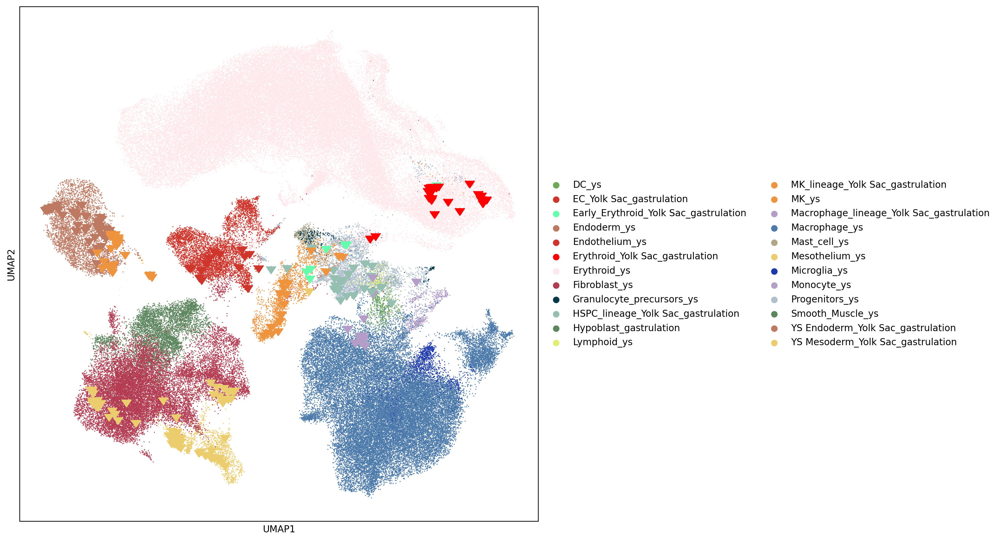

In [73]:
##Map to a pallete to use with umap
#cells_list = pd.DataFrame(adata.obs["cell.labels"].cat.categories)
#cells_list['col'] = cells_list[0].map(dic)
#col_pal = list(cells_list['col'])
adata.obs['num'] = adata.obs['num'].astype(str)
adata.obs[var+'_num'] = adata.obs['num'].astype(str) + " : " + adata.obs[var].astype(str)
import matplotlib
matplotlib.rcdefaults() #Reset matplot lb deafults as seaborne tends to mess with this
fig, ax = plt.subplots(1,figsize=(10,10))
#p3 = sc.pl.umap(adata, color = "num",legend_loc="on data",size=10,legend_fontsize='small',ax=ax1,show=False,title="mouse_vs_human", palette= col_pal) #title=i
#p2 = ax.scatter(adata.obsm['X_umap'][:,0][adata.obs["tissue"]=="YS"], adata.obsm['X_umap'][:,1][adata.obs["tissue"]=="YS"],c=adata.obs['col'][adata.obs["tissue"]=="YS"], s=1)
p2 = sc.pl.umap(adata, color = var ,ax=ax,show=False,title="",size=5,palette = col_dic) #title=i
#p4 = sc.pl.umap(adata, color = 'num',legend_loc=None,size=2,legend_fontsize='small',ax=ax,show=False, palette= list(col_dic.values())) #title=i
p3 = ax.scatter(adata.obsm['X_umap'][:,0][adata.obs['corr_concat'].str.contains('_gastrula')], adata.obsm['X_umap'][:,1][adata.obs['corr_concat'].str.contains('_gastrula')],c=adata.obs['col'][adata.obs['corr_concat'].str.contains('_gastrula')], s=100,marker=11)
fig.savefig('./'+var+"_broad_updated_gastrulation_orig_labels_vs_YS_040422.pdf",bbox_inches='tight')

# Plot with numbers

In [69]:
adata.obs['col'] = adata.obs[var].map(col_dic)
col_num_dic = dict(zip(list(adata.obs['num']),list(adata.obs['col'])))


var = "corr_concat"
#Create color dictionary
cells = list(adata.obs[var].unique())
col = list(range(0,len(adata.obs[var].unique())))
dic = dict(zip(cells,col))

#Create a mappable field
adata.obs['num'] = adata.obs[var]
#map to adata.obs.col to create a caterorical column
adata.obs['num'] = adata.obs['num'].map(dic)
#adata.obs['col'] ='#ff0000' 

##Map to a pallete to use with umap
#cells_list = pd.DataFrame(adata.obs["cell.labels"].cat.categories)
#cells_list['col'] = cells_list[0].map(dic)
#col_pal = list(cells_list['col'])
adata.obs['num'] = adata.obs['num'].astype(str)
adata.obs[var+'_num'] = adata.obs['num'].astype(str) + " : " + adata.obs[var].astype(str)
col_var_num_dic = dict(zip(list(adata.obs[var+'_num']),list(adata.obs['col'])))


In [71]:
adata.obs['col'] = adata.obs[var].map(col_dic)
col_num_dic = dict(zip(list(adata.obs['num']),list(adata.obs['col'])))
col_num_dic

{'0': '#EE943F',
 '1': '#ECCD6E',
 '2': '#BD7961',
 '3': '#D0352B',
 '4': '#94BFB1',
 '5': '#ff0000',
 '6': '#B49EC8',
 '7': '#63FFAC',
 '8': '#B43C52',
 '9': '#EE943E',
 '10': '#5C865E',
 '11': '#d0352b',
 '12': '#afbfcc',
 '13': '#FFE8EC',
 '14': '#bd7961',
 '15': '#4c7bab',
 '16': '#ee943f',
 '17': '#eccd6e',
 '18': '#b43c52',
 '19': '#b0a789',
 '20': '#6ea85b',
 '21': '#b49fc8',
 '22': '#05394a',
 '23': '#1e38ad',
 '24': '#5c865e',
 '25': '#e0ee71'}

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'num' as categorical
/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'corr_concat_num' as categorical


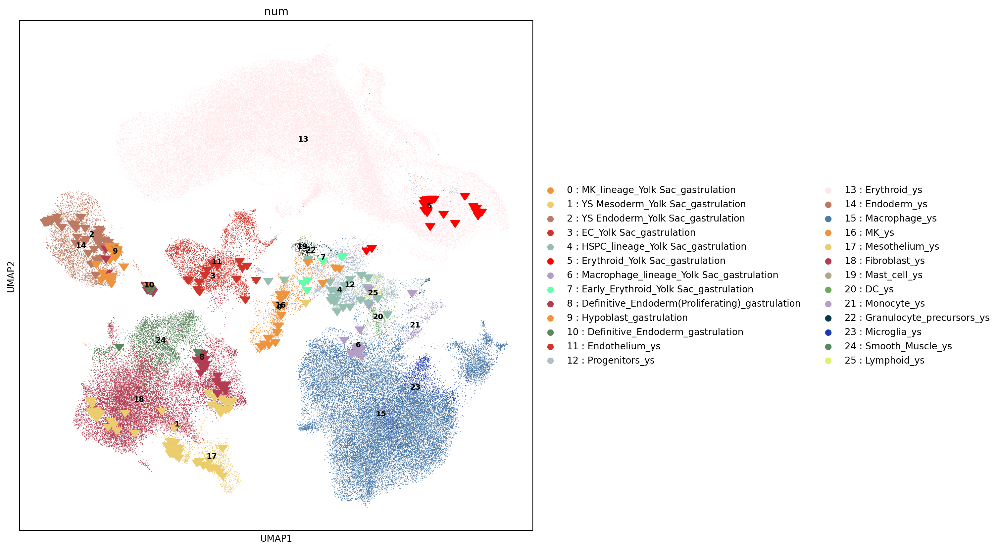

In [72]:
import matplotlib
matplotlib.rcdefaults() #Reset matplot lb deafults as seaborne tends to mess with this

fig, ax = plt.subplots(1,figsize=(10,10))
#p3 = sc.pl.umap(adata, color = "num",legend_loc="on data",size=10,legend_fontsize='small',ax=ax1,show=False,title="mouse_vs_human", palette= col_pal) #title=i
#p2 = ax.scatter(adata.obsm['X_umap'][:,0][adata.obs["tissue"]=="YS"], adata.obsm['X_umap'][:,1][adata.obs["tissue"]=="YS"],c=adata.obs['col'][adata.obs["tissue"]=="YS"], s=1)
p2 = sc.pl.umap(adata, color = (var+'_num') ,ax=ax,show=False,title="",palette =col_var_num_dic) #title=i
p4 = sc.pl.umap(adata, color = 'num',legend_loc='on data',size=2,legend_fontsize='small',ax=ax,show=False, palette= col_num_dic) #title=i
p3 = ax.scatter(adata.obsm['X_umap'][:,0][adata.obs["tissue"]=="gastrulation"], adata.obsm['X_umap'][:,1][adata.obs["tissue"]=="gastrulation"],c=adata.obs['col'][adata.obs["tissue"]=="gastrulation"], s=100,marker=11)

fig.savefig('./'+var+"_with_numbers_broad_updated_gastrulation_orig_labels_vs_YS.pdf",bbox_inches='tight')

In [143]:
# batch_correction = "Harmony" # Will accept Harmony, BBKNN or False as options
# batch = ['lr_batch'] # Will accept any batch categorical. Comma space a batch categorical for each dataset. Position 1 is for data1, position 2 is for data2
# batch = ['tissue'] # Will accept any batch categorical. Comma space a batch categorical for each dataset. Position 1 is for data1, position 2 is for data2
# sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
# if(batch_correction == "Harmony"):
#     print("Commencing harmony")
#     # Create hm subset
#     adata_hm = adata[:]
#     # Set harmony variables
#     data_mat = np.array(adata_hm.obsm["X_pca"])
#     meta_data = adata_hm.obs
#     vars_use = batch
#     # Run Harmony
#     ho = hm.run_harmony(data_mat, meta_data, vars_use,theta = 3)
#     res = (pd.DataFrame(ho.Z_corr)).T
#     res.columns = ['X{}'.format(i + 1) for i in range(res.shape[1])]
#     # Insert coordinates back into object
#     adata_hm.obsm["X_pca_back"]= adata_hm.obsm["X_pca"][:]
#     adata_hm.obsm["X_pca"] = np.array(res)
#     # Run neighbours
#     sc.pp.neighbors(adata_hm, n_neighbors=15, n_pcs=50)
#     sc.tl.umap(adata_hm)
#     adata = adata_hm[:]
#     del adata_hm
sc.tl.draw_graph(adata, layout='fa')
sc.pl.draw_graph(adata,color = [common_cat],legend_loc='on data',size = 30, save = './YS_gastrula_traj')

drawing single-cell graph using layout 'fa'


KeyboardInterrupt: 

# Hull

In [ ]:
from scipy.spatial import ConvexHull
import numpy as np
fig, ax = plt.subplots(1, figsize=(8,8))
# plot data
plt.scatter(adata.obsm['X_umap'][:,0][adata.obs["tissue"]=="gastrulation"], adata.obsm['X_umap'][:,1][adata.obs["tissue"]=="gastrulation"],c=adata.obs['col'][adata.obs["tissue"]=="gastrulation"], s=100,marker=11)
# plot centers
#plt.scatter(cen_x, cen_y, marker='^', c=colors, s=70)
# draw enclosure
umap_coord = pd.DataFrame(adata.obsm['X_umap'][adata.obs["tissue"]=="gastrulation"],columns = ['umap_1','umap_2'])
umap_coord['cluster'] = adata.obs['corr_concat'][adata.obs["tissue"]=="gastrulation"].values
colors = pd.DataFrame( adata.obs['col'][adata.obs["tissue"]=="gastrulation"].values,index = adata.obs['corr_concat'][adata.obs["tissue"]=="gastrulation"])
for i in umap_coord.cluster.unique():
    points = umap_coord[umap_coord.cluster == i][['umap_1', 'umap_2']].values
    # get convex hull
    hull = ConvexHull(points)
    # get x and y coordinates
    # repeat last point to close the polygon
    x_hull = np.append(points[hull.vertices,0],
                       points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],
                       points[hull.vertices,1][0])
    # plot shape
    plt.fill(x_hull, y_hull, alpha=0.3, c=''.join(colors.loc[i].iloc[0].astype(str)))
#plt.xlim(0,200)
#plt.ylim(0,200)
## With Interpolation
from scipy import interpolate
fig, ax = plt.subplots(1, figsize=(8,8))
plt.scatter(adata.obsm['X_umap'][:,0][adata.obs["tissue"]=="gastrulation"], adata.obsm['X_umap'][:,1][adata.obs["tissue"]=="gastrulation"],c=adata.obs['col'][adata.obs["tissue"]=="gastrulation"], s=100,marker=11)
# plot centers
umap_coord = pd.DataFrame(adata.obsm['X_umap'][adata.obs["tissue"]=="gastrulation"],columns = ['umap_1','umap_2'])
umap_coord['cluster'] = adata.obs['corr_concat'][adata.obs["tissue"]=="gastrulation"].values
colors = pd.DataFrame( adata.obs['col'][adata.obs["tissue"]=="gastrulation"].values,index = adata.obs['corr_concat'][adata.obs["tissue"]=="gastrulation"])
for i in umap_coord.cluster.unique():
    points = umap_coord[umap_coord.cluster == i][['umap_1', 'umap_2']].values
    # get convex hull
    hull = ConvexHull(points)
    # get x and y coordinates
    # repeat last point to close the polygon
    x_hull = np.append(points[hull.vertices,0],
                       points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],
                       points[hull.vertices,1][0])  
    # interpolate
    dist = np.sqrt((x_hull[:-1] - x_hull[1:])**2 + (y_hull[:-1] - y_hull[1:])**2)
    dist_along = np.concatenate(([0], dist.cumsum()))
    spline, u = interpolate.splprep([x_hull, y_hull], 
                                    u=dist_along, s=0)
    interp_d = np.linspace(dist_along[0], dist_along[-1], 100)
    interp_x, interp_y = interpolate.splev(interp_d, spline)
    # plot shape
    plt.fill(interp_x, interp_y, '--', c=''.join(colors.loc[i].iloc[0].astype(str)), alpha=0.2)
#plt.xlim(0,200)
#plt.ylim(0,200)

In [142]:
adata

AnnData object with n_obs × n_vars = 135059 × 2023
    obs: 'Unnamed: 0', 'X0', 'X1', 'cluster_id', 'sub_cluster', 'cluster', 'origin', 'size_factor', 'celltype_origin', 'batch', 'n_counts', 'tissue', 'lr_batch', 'corr_concat', 'cell.labels', 'stage', 'lanes', 'sex', 'sort.ids', 'fetal.ids', 'component', 'broad_cell.labels', 'sequencing.type', 'orig.dataset', 'broad_cell_labels_organ', 'V6_old_indexes', 'col', 'num', 'corr_concat_num', 'predicted', 'subclusters'
    var: 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'mt-1', 'total_counts-1', 'intersect-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'corr_concat_colors', 'corr_concat_num_colors', 'hvg', 'lr_batch_colors', 'neighbors', 'num_colors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_back', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# Let's make this broad labels
- spike monocyte
- spike HSPC1
- spike lymphoid progen

In [164]:
pred_out = pd.read_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/LR_human_gastrulation_ys/211121_predicted_lr_probs.csv',index_col = 0)

In [165]:
broad_mapper = dict(zip(list(adata.obs['cell.labels'].astype(str) + '_ys'),list(adata.obs['broad_cell.labels'])))
adata_key = adata[adata.obs['tissue'].isin(['gastrulation'])]

In [166]:
pred_out['orig_labels'] = adata_key.obs['corr_concat'].astype(str)

In [167]:
pred_out['predicted'] = pred_out['predicted'].map(broad_mapper)

In [98]:
#pred_out.to_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/LR_human_gastrulation_ys/predicted_lr_probs.csv')

# Plot all

Text(0.5, 542.1282051282051, 'Training labels')

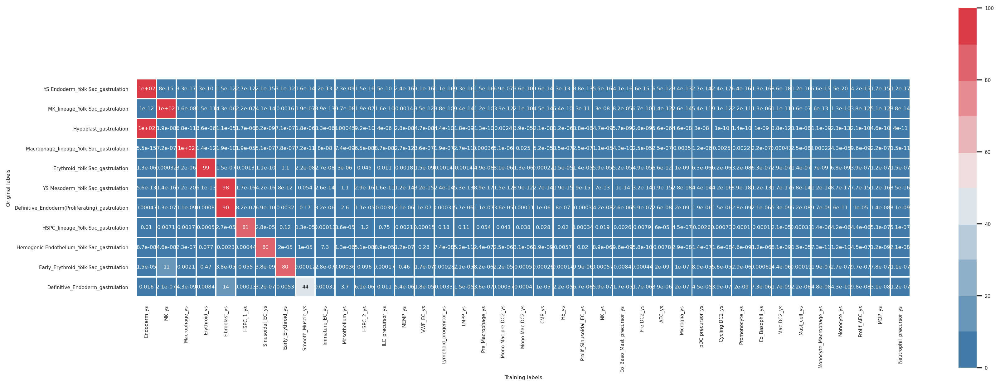

In [168]:
#model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').mean()
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').median()
model_mean_probs = model_mean_probs*100
model_mean_probs = model_mean_probs.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
crs_tbl = model_mean_probs.copy()

# Keep only predictions with probs >20
#crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]
# Keep only predicted labels with probs >20
#crs_tbl = crs_tbl[crs_tbl.max(axis=1) > trim]
# Sort df columns by rows
#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.columns), axis=0,ascending=False)

index_order = list(crs_tbl.max(axis=1).sort_values(ascending=False).index)
col_order = list(crs_tbl.max(axis=0).sort_values(ascending=False).index)
crs_tbl = crs_tbl.loc[index_order]
crs_tbl = crs_tbl[col_order]

# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=0.5)
g = sns.heatmap(crs_tbl, cmap=pal,  annot=True,vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})
plt.ylabel("Original labels")
plt.xlabel("Training labels")

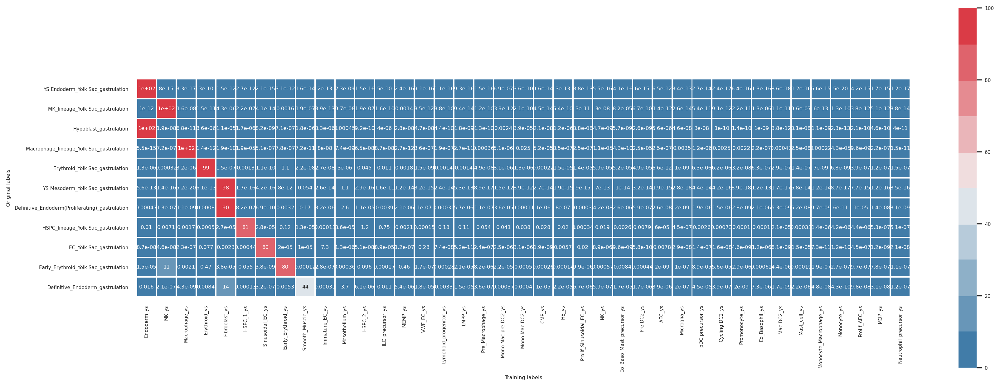

In [130]:
#model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').mean()
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').median()
model_mean_probs = model_mean_probs*100
model_mean_probs = model_mean_probs.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
crs_tbl = model_mean_probs.copy()

# Keep only predictions with probs >20
#crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]
# Keep only predicted labels with probs >20
#crs_tbl = crs_tbl[crs_tbl.max(axis=1) > trim]
# Sort df columns by rows
#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.columns), axis=0,ascending=False)

index_order = list(crs_tbl.max(axis=1).sort_values(ascending=False).index)
col_order = list(crs_tbl.max(axis=0).sort_values(ascending=False).index)
crs_tbl = crs_tbl.loc[index_order]
crs_tbl = crs_tbl[col_order]

# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=0.5)
g = sns.heatmap(crs_tbl, cmap=pal,  annot=True,vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})
plt.ylabel("Original labels")
plt.xlabel("Training labels")
plt.savefig('./ver8_full_subclusters_lr_model_means_clusters.pdf',dpi=300)

# trim

In [157]:
list(crs_tbl.index)

['HSPC_lineage_Yolk Sac_gastrulation',
 'Macrophage_lineage_Yolk Sac_gastrulation',
 'MK_lineage_Yolk Sac_gastrulation',
 'Early_Erythroid_Yolk Sac_gastrulation',
 'Erythroid_Yolk Sac_gastrulation',
 'EC_Yolk Sac_gastrulation',
 'YS Mesoderm_Yolk Sac_gastrulation',
 'Hypoblast_gastrulation',
 'YS Endoderm_Yolk Sac_gastrulation']

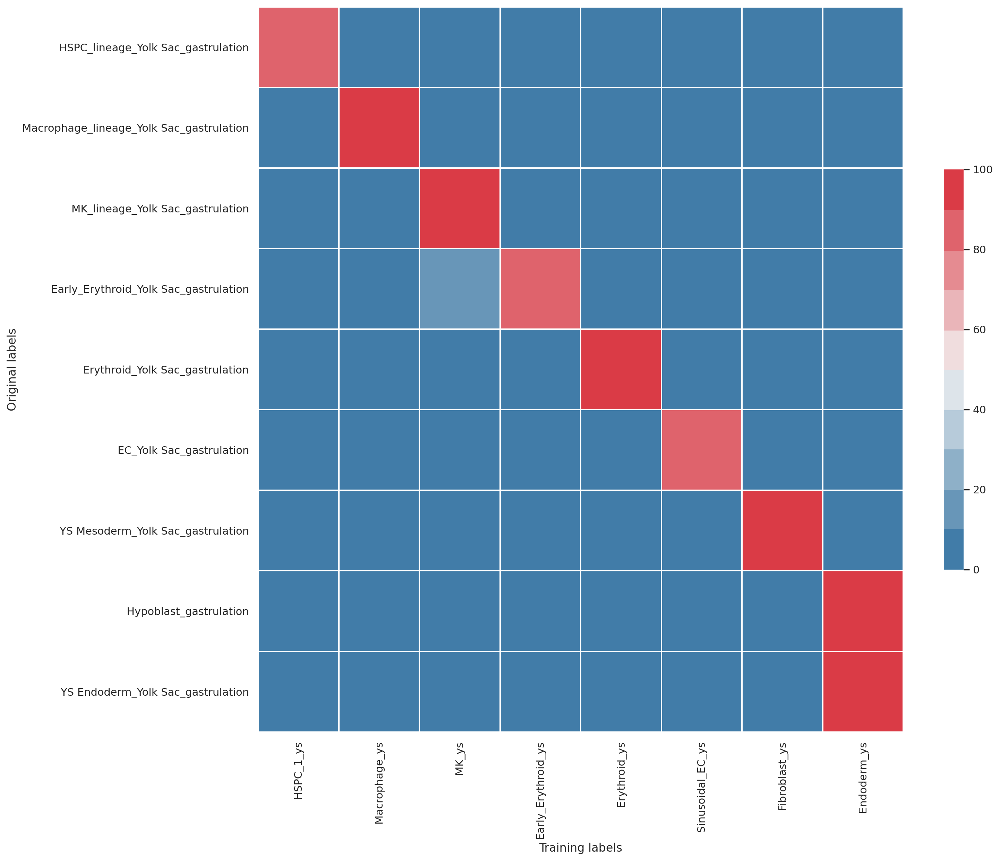

In [158]:
trim = 20
pred_out

#model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').mean()
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').median()
model_mean_probs = model_mean_probs*100
model_mean_probs = model_mean_probs.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
crs_tbl = model_mean_probs.copy()

# Keep only predictions with probs >2
#crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]

# Keep only predicted labels with probs >20
#crs_tbl = crs_tbl[crs_tbl.max(axis=1) > trim]

# Sort df columns by rows

#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.columns), axis=0,ascending=False)

#index_order = list(crs_tbl.max(axis=1).sort_values(ascending=False).index)
#col_order = list(crs_tbl.max(axis=0).sort_values(ascending=False).index)


index_order = ['HSPC_lineage_Yolk Sac_gastrulation',
 'Macrophage_lineage_Yolk Sac_gastrulation',
 'MK_lineage_Yolk Sac_gastrulation',
 'Early_Erythroid_Yolk Sac_gastrulation',
 'Erythroid_Yolk Sac_gastrulation',
'EC_Yolk Sac_gastrulation',
 'YS Mesoderm_Yolk Sac_gastrulation',
#'Definitive_Endoderm(Proliferating)_gastrulation',
# 'Definitive_Endoderm_gastrulation',
 'Hypoblast_gastrulation',
 'YS Endoderm_Yolk Sac_gastrulation',]

col_order = [ 'HSPC_1_ys',
'Macrophage_ys',
 'MK_ys',
 'Early_Erythroid_ys',
 'Erythroid_ys',
'Sinusoidal_EC_ys',
 #'Prolif_Sinusoidal_EC_ys',
'Fibroblast_ys',
#'Smooth_Muscle_ys',
# 'Mesothelium_ys',
 'Endoderm_ys',]


crs_tbl = crs_tbl.loc[index_order]
crs_tbl = crs_tbl[col_order]

# Keep only predictions with probs >20
#crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]

# Keep only predicted labels with probs >20
#crs_tbl = crs_tbl[crs_tbl.max(axis=1) > trim]

crs_tbl = crs_tbl[col_order]
crs_tbl = crs_tbl[crs_tbl.index.isin(index_order)]


# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(15,15))
sns.set(font_scale=1)
g = sns.heatmap(crs_tbl, cmap=pal,  annot=False,vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})
plt.ylabel("Original labels")
plt.xlabel("Training labels")

plt.savefig('./ver8_trim_lr_model_means_clusters.pdf',dpi=300,bbox_inches='tight')

# with spiked

In [159]:
#model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').mean()
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').median()
model_mean_probs = model_mean_probs*100
model_mean_probs = model_mean_probs.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
crs_tbl = model_mean_probs.copy()

In [160]:
list(crs_tbl.columns)

['AEC_ys',
 'CMP_ys',
 'Cycling DC2_ys',
 'Early_Erythroid_ys',
 'Endoderm_ys',
 'Eo_Baso_Mast_precursor_ys',
 'Eo_Basophil_ys',
 'Erythroid_ys',
 'Fibroblast_ys',
 'HE_ys',
 'HSPC_1_ys',
 'HSPC_2_ys',
 'ILC_precursor_ys',
 'Immature_EC_ys',
 'LMPP_ys',
 'Lymphoid_progenitor_ys',
 'MEMP_ys',
 'MK_ys',
 'MOP_ys',
 'Mac DC2_ys',
 'Macrophage_ys',
 'Mast_cell_ys',
 'Mesothelium_ys',
 'Microglia_ys',
 'Mono Mac DC2_ys',
 'Mono Mac pre DC2_ys',
 'Monocyte_Macrophage_ys',
 'Monocyte_ys',
 'NK_ys',
 'Neutrophil_precursor_ys',
 'Pre DC2_ys',
 'Pre_Macrophage_ys',
 'Prolif_AEC_ys',
 'Prolif_Sinusoidal_EC_ys',
 'Promonocyte_ys',
 'Sinusoidal_EC_ys',
 'Smooth_Muscle_ys',
 'VWF_EC_ys',
 'pDC precursor_ys']

In [161]:
crs_tbl

,AEC_ys,CMP_ys,Cycling DC2_ys,Early_Erythroid_ys,Endoderm_ys,Eo_Baso_Mast_precursor_ys,Eo_Basophil_ys,Erythroid_ys,Fibroblast_ys,HE_ys,...,Neutrophil_precursor_ys,Pre DC2_ys,Pre_Macrophage_ys,Prolif_AEC_ys,Prolif_Sinusoidal_EC_ys,Promonocyte_ys,Sinusoidal_EC_ys,Smooth_Muscle_ys,VWF_EC_ys,pDC precursor_ys
orig_labels,,,,,,,,,,,,,,,,,,,,,
Definitive_Endoderm(Proliferating)_gastrulation,2.643784e-08,1.001989e-06,1.524602e-06,3.166472e-03,4.716111e-04,2.598750e-06,2.143940e-06,7.981328e-04,8.995826e+01,7.959661e-07,...,8.085035e-09,5.891572e-07,1.055328e-07,1.031533e-05,2.956887e-04,2.798501e-09,6.925319e-10,1.673432e-01,1.020526e-07,1.861654e-06
Definitive_Endoderm_gastrulation,3.938672e-06,1.048584e-05,3.901697e-07,5.269116e-03,1.639303e-02,1.744728e-05,7.291081e-06,8.441428e-03,1.443069e+01,2.169185e-05,...,1.193181e-07,1.705592e-06,3.596272e-07,9.844031e-08,6.728407e-06,1.985320e-09,3.224665e-07,4.400219e+01,1.794089e-05,4.474969e-05
EC_Yolk Sac_gastrulation,7.811563e-03,1.876226e-09,1.600600e-08,1.953485e-05,8.730944e-08,9.618253e-09,1.221255e-06,7.693536e-02,2.306812e-03,5.673772e-03,...,2.110563e-08,5.750687e-10,2.405464e-07,4.518437e-07,1.967006e-02,4.553407e-09,8.022111e+01,1.013675e-05,2.801344e-01,1.351518e-07
Early_Erythroid_Yolk Sac_gastrulation,1.984256e-09,2.647248e-04,5.585365e-05,7.991881e+01,1.481108e-05,8.371284e-03,6.248107e-04,4.710950e-01,3.767907e-05,1.392427e-04,...,1.126161e-07,4.421028e-04,8.237776e-06,9.713988e-07,9.932389e-06,2.901999e-06,3.806100e-09,1.246191e-04,1.657041e-07,8.897249e-05
Erythroid_Yolk Sac_gastrulation,6.584023e-12,2.171742e-04,6.223181e-06,1.089347e+00,1.310382e-06,5.220641e-05,6.297939e-07,9.877140e+01,1.467064e-07,1.526469e-05,...,1.465003e-07,4.907418e-05,4.939120e-08,3.932969e-07,1.364162e-05,3.240899e-08,1.100330e-10,2.210079e-08,1.479428e-09,6.257286e-06
HSPC_lineage_Yolk Sac_gastrulation,6.016477e-05,2.774791e-02,7.293967e-04,1.209633e-01,9.983433e-03,2.584152e-03,1.036993e-04,4.973518e-04,2.734578e-05,2.011785e-02,...,5.142192e-07,7.867107e-03,5.395968e-02,4.381670e-06,3.414438e-04,1.001759e-04,2.798599e-05,1.323165e-05,1.489854e-04,2.648822e-03
Hypoblast_gastrulation,5.597737e-06,2.132673e-08,1.029831e-10,7.096477e-07,9.999062e+01,5.652728e-09,1.024849e-09,8.579620e-06,1.098445e-05,1.247993e-06,...,3.955465e-11,2.622655e-09,1.306531e-10,2.064865e-10,3.782290e-08,1.427337e-10,8.224900e-09,1.835224e-06,4.739743e-08,2.957201e-08
MK_lineage_Yolk Sac_gastrulation,1.410060e-12,4.547645e-14,9.056910e-12,1.560154e-03,1.012061e-12,8.216086e-05,1.346145e-06,1.507304e-11,4.341851e-06,5.360092e-10,...,8.836616e-14,6.731409e-10,1.218364e-10,3.774695e-12,2.960731e-11,2.150258e-11,4.080508e-14,1.927323e-07,3.478118e-12,5.354793e-11
Macrophage_lineage_Yolk Sac_gastrulation,2.490201e-07,5.248250e-05,2.515414e-03,7.782558e-07,5.533283e-15,4.304410e-10,2.196175e-07,1.396221e-12,1.892667e-10,3.486687e-07,...,1.498887e-11,2.453194e-05,3.580575e-04,9.594252e-09,2.537469e-07,2.190827e-03,5.074829e-07,7.197929e-11,3.603264e-07,1.188390e-06


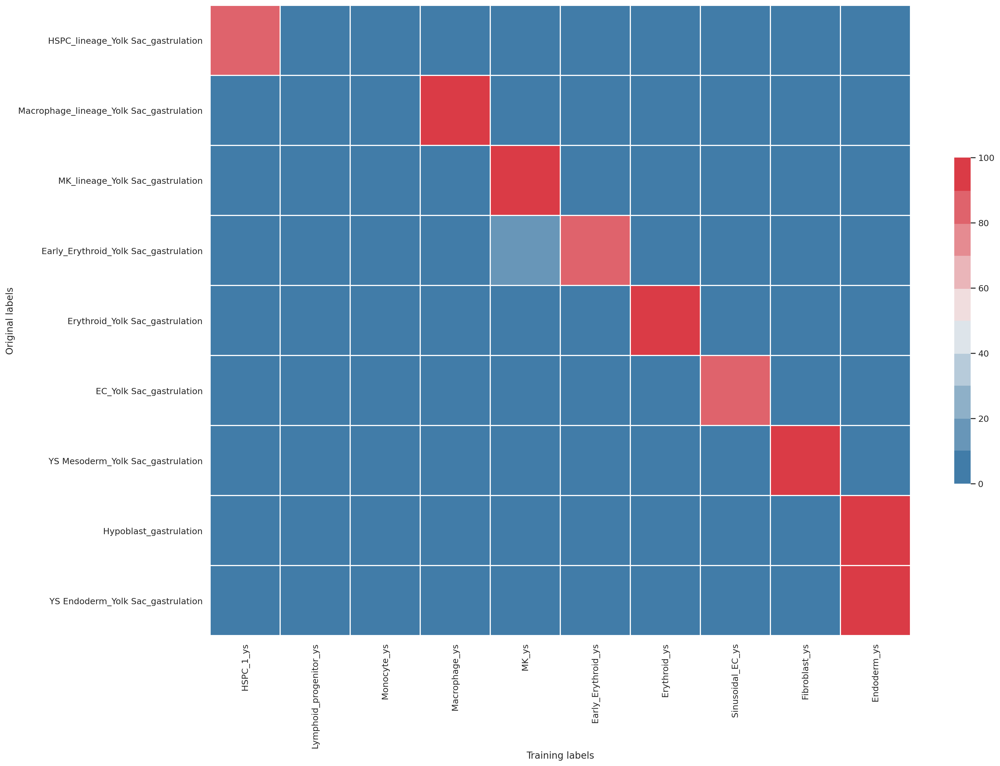

In [162]:
trim = 20
pred_out

#model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').mean()
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').median()
model_mean_probs = model_mean_probs*100
model_mean_probs = model_mean_probs.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
crs_tbl = model_mean_probs.copy()

# Keep only predictions with probs >2
#crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]

# Keep only predicted labels with probs >20
#crs_tbl = crs_tbl[crs_tbl.max(axis=1) > trim]

# Sort df columns by rows

#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.columns), axis=0,ascending=False)

#index_order = list(crs_tbl.max(axis=1).sort_values(ascending=False).index)
#col_order = list(crs_tbl.max(axis=0).sort_values(ascending=False).index)


index_order = ['HSPC_lineage_Yolk Sac_gastrulation',
 'Macrophage_lineage_Yolk Sac_gastrulation',
 'MK_lineage_Yolk Sac_gastrulation',
 'Early_Erythroid_Yolk Sac_gastrulation',
 'Erythroid_Yolk Sac_gastrulation',
'EC_Yolk Sac_gastrulation',
 'YS Mesoderm_Yolk Sac_gastrulation',
#'Definitive_Endoderm(Proliferating)_gastrulation',
# 'Definitive_Endoderm_gastrulation',
 'Hypoblast_gastrulation',
 'YS Endoderm_Yolk Sac_gastrulation',
]

col_order = [ 'HSPC_1_ys',
'Lymphoid_progenitor_ys',
'Monocyte_ys',
'Macrophage_ys',
 'MK_ys',
 'Early_Erythroid_ys',
 'Erythroid_ys',
'Sinusoidal_EC_ys',
'Fibroblast_ys',
#'Smooth_Muscle_ys',
 'Endoderm_ys',
]


crs_tbl = crs_tbl.loc[index_order]
crs_tbl = crs_tbl[col_order]

# Keep only predictions with probs >20
#crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]
crs_tbl = crs_tbl[col_order]

# Keep only predicted labels with probs >20
crs_tbl = crs_tbl[crs_tbl.index.isin(index_order)]


crs_tbl = crs_tbl[col_order]
# Keep only predicted labels with probs >20
crs_tbl = crs_tbl[crs_tbl.index.isin(index_order)]


# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=1)
g = sns.heatmap(crs_tbl, cmap=pal,  annot=False,vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})
plt.ylabel("Original labels")
plt.xlabel("Training labels")

plt.savefig('./ver8_with_mono_lmp_trim_lr_model_means_clusters.pdf',dpi=300,bbox_inches='tight')

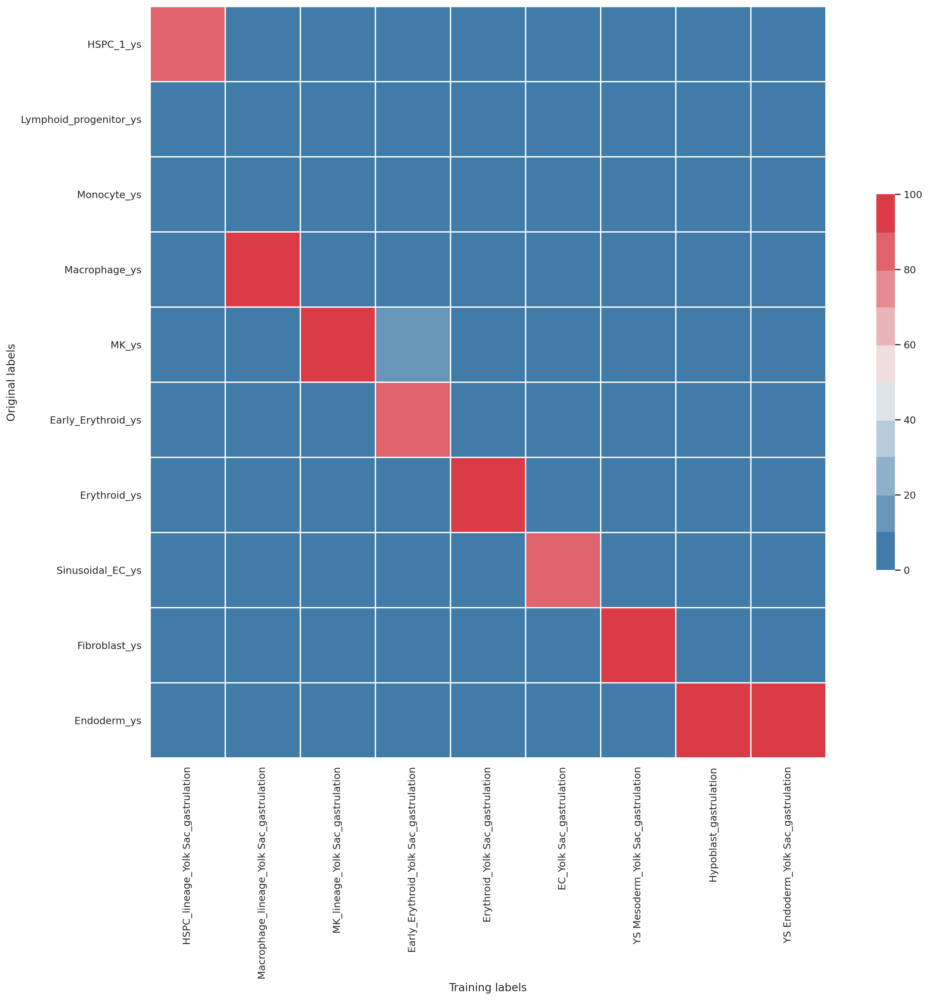

In [163]:
trim = 20
pred_out

#model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').mean()
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').median()
model_mean_probs = model_mean_probs*100
model_mean_probs = model_mean_probs.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
crs_tbl = model_mean_probs.copy()

# Keep only predictions with probs >2
#crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]

# Keep only predicted labels with probs >20
#crs_tbl = crs_tbl[crs_tbl.max(axis=1) > trim]

# Sort df columns by rows

#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.columns), axis=0,ascending=False)

#index_order = list(crs_tbl.max(axis=1).sort_values(ascending=False).index)
#col_order = list(crs_tbl.max(axis=0).sort_values(ascending=False).index)


index_order = ['HSPC_lineage_Yolk Sac_gastrulation',
 'Macrophage_lineage_Yolk Sac_gastrulation',
 'MK_lineage_Yolk Sac_gastrulation',
 'Early_Erythroid_Yolk Sac_gastrulation',
 'Erythroid_Yolk Sac_gastrulation',
'EC_Yolk Sac_gastrulation',
 'YS Mesoderm_Yolk Sac_gastrulation',
#'Definitive_Endoderm(Proliferating)_gastrulation',
# 'Definitive_Endoderm_gastrulation',
 'Hypoblast_gastrulation',
 'YS Endoderm_Yolk Sac_gastrulation',
]

col_order = [ 'HSPC_1_ys',
'Lymphoid_progenitor_ys',
'Monocyte_ys',
'Macrophage_ys',
 'MK_ys',
 'Early_Erythroid_ys',
 'Erythroid_ys',
'Sinusoidal_EC_ys',
'Fibroblast_ys',
#'Smooth_Muscle_ys',
 'Endoderm_ys',
]


crs_tbl = crs_tbl.loc[index_order]
crs_tbl = crs_tbl[col_order]

# Keep only predictions with probs >20
#crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]
crs_tbl = crs_tbl[col_order]


# Keep only predicted labels with probs >20
crs_tbl = crs_tbl[crs_tbl.index.isin(index_order)]
crs_tbl = crs_tbl.T

# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=1)
g = sns.heatmap(crs_tbl, cmap=pal,  annot=False,vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})
plt.ylabel("Original labels")
plt.xlabel("Training labels")

plt.savefig('./ver8_transposed_with_mono_lmp_trim_lr_model_means_clusters.pdf',dpi=300,bbox_inches='tight')

# Plot only myeloid on cell.labels

In [169]:
pred_out = pd.read_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/LR_human_gastrulation_ys/211121_predicted_lr_probs.csv',index_col = 0)

In [170]:
broad_mapper = dict(zip(list(adata.obs['cell.labels'].astype(str) + '_ys'),list(adata.obs['broad_cell.labels'])))
adata_key = adata[adata.obs['tissue'].isin(['gastrulation'])]

In [171]:
pred_out['orig_labels'] = adata_key.obs['corr_concat'].astype(str)

In [172]:
#pred_out['predicted'] = pred_out['predicted'].map(broad_mapper)

In [173]:
#pred_out.to_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/LR_human_gastrulation_ys/predicted_lr_probs.csv')

# Plot all

Text(0.5, 542.1282051282051, 'Training labels')

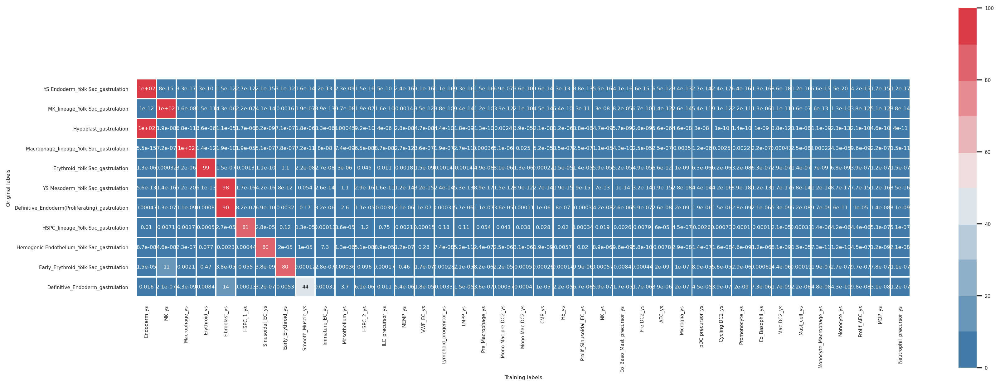

In [174]:
#model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').mean()
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').median()
model_mean_probs = model_mean_probs*100
model_mean_probs = model_mean_probs.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
crs_tbl = model_mean_probs.copy()

# Keep only predictions with probs >20
#crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]
# Keep only predicted labels with probs >20
#crs_tbl = crs_tbl[crs_tbl.max(axis=1) > trim]
# Sort df columns by rows
#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.columns), axis=0,ascending=False)

index_order = list(crs_tbl.max(axis=1).sort_values(ascending=False).index)
col_order = list(crs_tbl.max(axis=0).sort_values(ascending=False).index)
crs_tbl = crs_tbl.loc[index_order]
crs_tbl = crs_tbl[col_order]

# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=0.5)
g = sns.heatmap(crs_tbl, cmap=pal,  annot=True,vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})
plt.ylabel("Original labels")
plt.xlabel("Training labels")

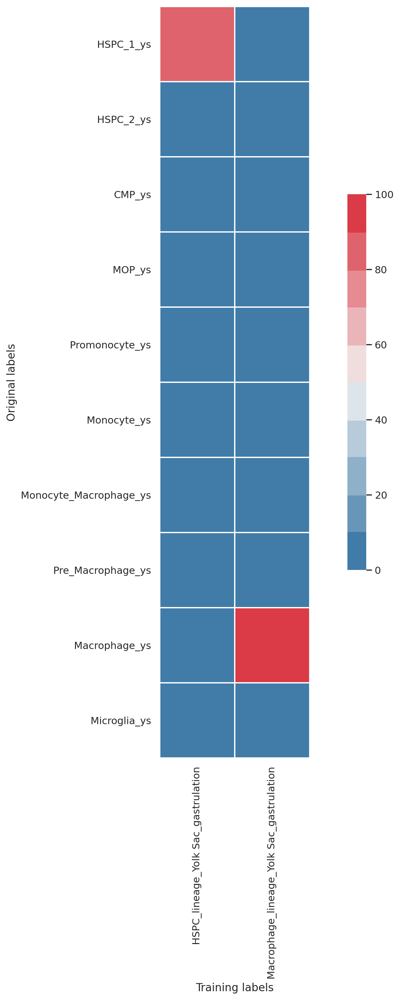

In [176]:
#model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').mean()
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').median()
model_mean_probs = model_mean_probs*100
model_mean_probs = model_mean_probs.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
crs_tbl = model_mean_probs.copy()

# Keep only predictions with probs >2
#crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]

# Keep only predicted labels with probs >20
#crs_tbl = crs_tbl[crs_tbl.max(axis=1) > trim]

# Sort df columns by rows

#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.columns), axis=0,ascending=False)

#index_order = list(crs_tbl.max(axis=1).sort_values(ascending=False).index)
#col_order = list(crs_tbl.max(axis=0).sort_values(ascending=False).index)


index_order = ['HSPC_lineage_Yolk Sac_gastrulation',
 'Macrophage_lineage_Yolk Sac_gastrulation',]

col_order = ["HSPC_1_ys",
"HSPC_2_ys",
"CMP_ys",
"MOP_ys",
"Promonocyte_ys",
"Monocyte_ys",
"Monocyte_Macrophage_ys",
"Pre_Macrophage_ys",
"Macrophage_ys",
"Microglia_ys",]


crs_tbl = crs_tbl.loc[index_order]
crs_tbl = crs_tbl[col_order]

# Keep only predictions with probs >20
#crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]

# Keep only predicted labels with probs >20
#crs_tbl = crs_tbl[crs_tbl.max(axis=1) > trim]

crs_tbl = crs_tbl[col_order]
crs_tbl = crs_tbl[crs_tbl.index.isin(index_order)]


# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(15,15))
sns.set(font_scale=1)
g = sns.heatmap(crs_tbl.T, cmap=pal,  annot=False,vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})
plt.ylabel("Original labels")
plt.xlabel("Training labels")

plt.savefig('./fig3_myeloid_only_ver8_trim_lr_model_means_clusters.pdf',dpi=300,bbox_inches='tight')

# with spiked

In [159]:
#model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').mean()
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').median()
model_mean_probs = model_mean_probs*100
model_mean_probs = model_mean_probs.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
crs_tbl = model_mean_probs.copy()

In [160]:
list(crs_tbl.columns)

['AEC_ys',
 'CMP_ys',
 'Cycling DC2_ys',
 'Early_Erythroid_ys',
 'Endoderm_ys',
 'Eo_Baso_Mast_precursor_ys',
 'Eo_Basophil_ys',
 'Erythroid_ys',
 'Fibroblast_ys',
 'HE_ys',
 'HSPC_1_ys',
 'HSPC_2_ys',
 'ILC_precursor_ys',
 'Immature_EC_ys',
 'LMPP_ys',
 'Lymphoid_progenitor_ys',
 'MEMP_ys',
 'MK_ys',
 'MOP_ys',
 'Mac DC2_ys',
 'Macrophage_ys',
 'Mast_cell_ys',
 'Mesothelium_ys',
 'Microglia_ys',
 'Mono Mac DC2_ys',
 'Mono Mac pre DC2_ys',
 'Monocyte_Macrophage_ys',
 'Monocyte_ys',
 'NK_ys',
 'Neutrophil_precursor_ys',
 'Pre DC2_ys',
 'Pre_Macrophage_ys',
 'Prolif_AEC_ys',
 'Prolif_Sinusoidal_EC_ys',
 'Promonocyte_ys',
 'Sinusoidal_EC_ys',
 'Smooth_Muscle_ys',
 'VWF_EC_ys',
 'pDC precursor_ys']

In [161]:
crs_tbl

,AEC_ys,CMP_ys,Cycling DC2_ys,Early_Erythroid_ys,Endoderm_ys,Eo_Baso_Mast_precursor_ys,Eo_Basophil_ys,Erythroid_ys,Fibroblast_ys,HE_ys,...,Neutrophil_precursor_ys,Pre DC2_ys,Pre_Macrophage_ys,Prolif_AEC_ys,Prolif_Sinusoidal_EC_ys,Promonocyte_ys,Sinusoidal_EC_ys,Smooth_Muscle_ys,VWF_EC_ys,pDC precursor_ys
orig_labels,,,,,,,,,,,,,,,,,,,,,
Definitive_Endoderm(Proliferating)_gastrulation,2.643784e-08,1.001989e-06,1.524602e-06,3.166472e-03,4.716111e-04,2.598750e-06,2.143940e-06,7.981328e-04,8.995826e+01,7.959661e-07,...,8.085035e-09,5.891572e-07,1.055328e-07,1.031533e-05,2.956887e-04,2.798501e-09,6.925319e-10,1.673432e-01,1.020526e-07,1.861654e-06
Definitive_Endoderm_gastrulation,3.938672e-06,1.048584e-05,3.901697e-07,5.269116e-03,1.639303e-02,1.744728e-05,7.291081e-06,8.441428e-03,1.443069e+01,2.169185e-05,...,1.193181e-07,1.705592e-06,3.596272e-07,9.844031e-08,6.728407e-06,1.985320e-09,3.224665e-07,4.400219e+01,1.794089e-05,4.474969e-05
EC_Yolk Sac_gastrulation,7.811563e-03,1.876226e-09,1.600600e-08,1.953485e-05,8.730944e-08,9.618253e-09,1.221255e-06,7.693536e-02,2.306812e-03,5.673772e-03,...,2.110563e-08,5.750687e-10,2.405464e-07,4.518437e-07,1.967006e-02,4.553407e-09,8.022111e+01,1.013675e-05,2.801344e-01,1.351518e-07
Early_Erythroid_Yolk Sac_gastrulation,1.984256e-09,2.647248e-04,5.585365e-05,7.991881e+01,1.481108e-05,8.371284e-03,6.248107e-04,4.710950e-01,3.767907e-05,1.392427e-04,...,1.126161e-07,4.421028e-04,8.237776e-06,9.713988e-07,9.932389e-06,2.901999e-06,3.806100e-09,1.246191e-04,1.657041e-07,8.897249e-05
Erythroid_Yolk Sac_gastrulation,6.584023e-12,2.171742e-04,6.223181e-06,1.089347e+00,1.310382e-06,5.220641e-05,6.297939e-07,9.877140e+01,1.467064e-07,1.526469e-05,...,1.465003e-07,4.907418e-05,4.939120e-08,3.932969e-07,1.364162e-05,3.240899e-08,1.100330e-10,2.210079e-08,1.479428e-09,6.257286e-06
HSPC_lineage_Yolk Sac_gastrulation,6.016477e-05,2.774791e-02,7.293967e-04,1.209633e-01,9.983433e-03,2.584152e-03,1.036993e-04,4.973518e-04,2.734578e-05,2.011785e-02,...,5.142192e-07,7.867107e-03,5.395968e-02,4.381670e-06,3.414438e-04,1.001759e-04,2.798599e-05,1.323165e-05,1.489854e-04,2.648822e-03
Hypoblast_gastrulation,5.597737e-06,2.132673e-08,1.029831e-10,7.096477e-07,9.999062e+01,5.652728e-09,1.024849e-09,8.579620e-06,1.098445e-05,1.247993e-06,...,3.955465e-11,2.622655e-09,1.306531e-10,2.064865e-10,3.782290e-08,1.427337e-10,8.224900e-09,1.835224e-06,4.739743e-08,2.957201e-08
MK_lineage_Yolk Sac_gastrulation,1.410060e-12,4.547645e-14,9.056910e-12,1.560154e-03,1.012061e-12,8.216086e-05,1.346145e-06,1.507304e-11,4.341851e-06,5.360092e-10,...,8.836616e-14,6.731409e-10,1.218364e-10,3.774695e-12,2.960731e-11,2.150258e-11,4.080508e-14,1.927323e-07,3.478118e-12,5.354793e-11
Macrophage_lineage_Yolk Sac_gastrulation,2.490201e-07,5.248250e-05,2.515414e-03,7.782558e-07,5.533283e-15,4.304410e-10,2.196175e-07,1.396221e-12,1.892667e-10,3.486687e-07,...,1.498887e-11,2.453194e-05,3.580575e-04,9.594252e-09,2.537469e-07,2.190827e-03,5.074829e-07,7.197929e-11,3.603264e-07,1.188390e-06


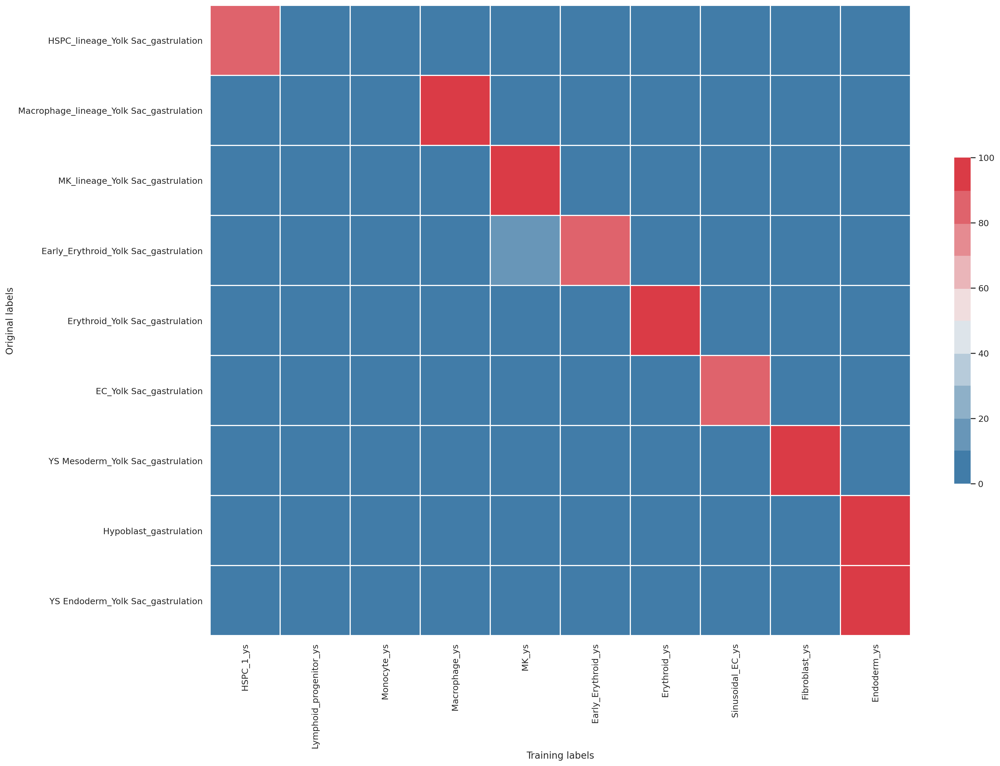

In [162]:
trim = 20
pred_out

#model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').mean()
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').median()
model_mean_probs = model_mean_probs*100
model_mean_probs = model_mean_probs.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
crs_tbl = model_mean_probs.copy()

# Keep only predictions with probs >2
#crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]

# Keep only predicted labels with probs >20
#crs_tbl = crs_tbl[crs_tbl.max(axis=1) > trim]

# Sort df columns by rows

#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.columns), axis=0,ascending=False)

#index_order = list(crs_tbl.max(axis=1).sort_values(ascending=False).index)
#col_order = list(crs_tbl.max(axis=0).sort_values(ascending=False).index)


index_order = ['HSPC_lineage_Yolk Sac_gastrulation',
 'Macrophage_lineage_Yolk Sac_gastrulation',
 'MK_lineage_Yolk Sac_gastrulation',
 'Early_Erythroid_Yolk Sac_gastrulation',
 'Erythroid_Yolk Sac_gastrulation',
'EC_Yolk Sac_gastrulation',
 'YS Mesoderm_Yolk Sac_gastrulation',
#'Definitive_Endoderm(Proliferating)_gastrulation',
# 'Definitive_Endoderm_gastrulation',
 'Hypoblast_gastrulation',
 'YS Endoderm_Yolk Sac_gastrulation',
]

col_order = [ 'HSPC_1_ys',
'Lymphoid_progenitor_ys',
'Monocyte_ys',
'Macrophage_ys',
 'MK_ys',
 'Early_Erythroid_ys',
 'Erythroid_ys',
'Sinusoidal_EC_ys',
'Fibroblast_ys',
#'Smooth_Muscle_ys',
 'Endoderm_ys',
]


crs_tbl = crs_tbl.loc[index_order]
crs_tbl = crs_tbl[col_order]

# Keep only predictions with probs >20
#crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]
crs_tbl = crs_tbl[col_order]

# Keep only predicted labels with probs >20
crs_tbl = crs_tbl[crs_tbl.index.isin(index_order)]


crs_tbl = crs_tbl[col_order]
# Keep only predicted labels with probs >20
crs_tbl = crs_tbl[crs_tbl.index.isin(index_order)]


# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=1)
g = sns.heatmap(crs_tbl, cmap=pal,  annot=False,vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})
plt.ylabel("Original labels")
plt.xlabel("Training labels")

plt.savefig('./ver8_with_mono_lmp_trim_lr_model_means_clusters.pdf',dpi=300,bbox_inches='tight')

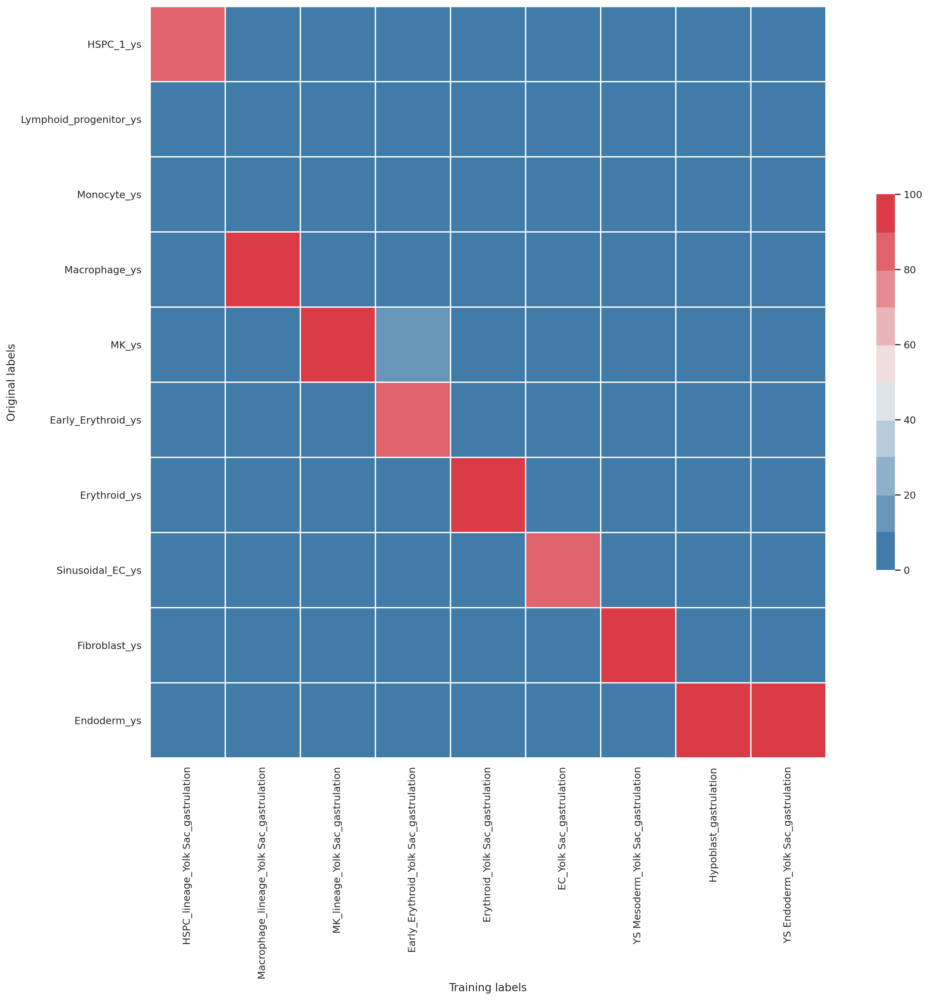

In [163]:
trim = 20
pred_out

#model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').mean()
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').median()
model_mean_probs = model_mean_probs*100
model_mean_probs = model_mean_probs.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
crs_tbl = model_mean_probs.copy()

# Keep only predictions with probs >2
#crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]

# Keep only predicted labels with probs >20
#crs_tbl = crs_tbl[crs_tbl.max(axis=1) > trim]

# Sort df columns by rows

#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.columns), axis=0,ascending=False)

#index_order = list(crs_tbl.max(axis=1).sort_values(ascending=False).index)
#col_order = list(crs_tbl.max(axis=0).sort_values(ascending=False).index)


index_order = ['HSPC_lineage_Yolk Sac_gastrulation',
 'Macrophage_lineage_Yolk Sac_gastrulation',
 'MK_lineage_Yolk Sac_gastrulation',
 'Early_Erythroid_Yolk Sac_gastrulation',
 'Erythroid_Yolk Sac_gastrulation',
'EC_Yolk Sac_gastrulation',
 'YS Mesoderm_Yolk Sac_gastrulation',
#'Definitive_Endoderm(Proliferating)_gastrulation',
# 'Definitive_Endoderm_gastrulation',
 'Hypoblast_gastrulation',
 'YS Endoderm_Yolk Sac_gastrulation',
]

col_order = [ 'HSPC_1_ys',
'Lymphoid_progenitor_ys',
'Monocyte_ys',
'Macrophage_ys',
 'MK_ys',
 'Early_Erythroid_ys',
 'Erythroid_ys',
'Sinusoidal_EC_ys',
'Fibroblast_ys',
#'Smooth_Muscle_ys',
 'Endoderm_ys',
]


crs_tbl = crs_tbl.loc[index_order]
crs_tbl = crs_tbl[col_order]

# Keep only predictions with probs >20
#crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]
crs_tbl = crs_tbl[col_order]


# Keep only predicted labels with probs >20
crs_tbl = crs_tbl[crs_tbl.index.isin(index_order)]
crs_tbl = crs_tbl.T

# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=1)
g = sns.heatmap(crs_tbl, cmap=pal,  annot=False,vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})
plt.ylabel("Original labels")
plt.xlabel("Training labels")

plt.savefig('./ver8_transposed_with_mono_lmp_trim_lr_model_means_clusters.pdf',dpi=300,bbox_inches='tight')

# DEGS

In [133]:
adata_temp = adata
adata = adata[adata.obs['tissue'].isin(['gastrulation'])]

ranking genes


Trying to set attribute `.uns` of view, copying.


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


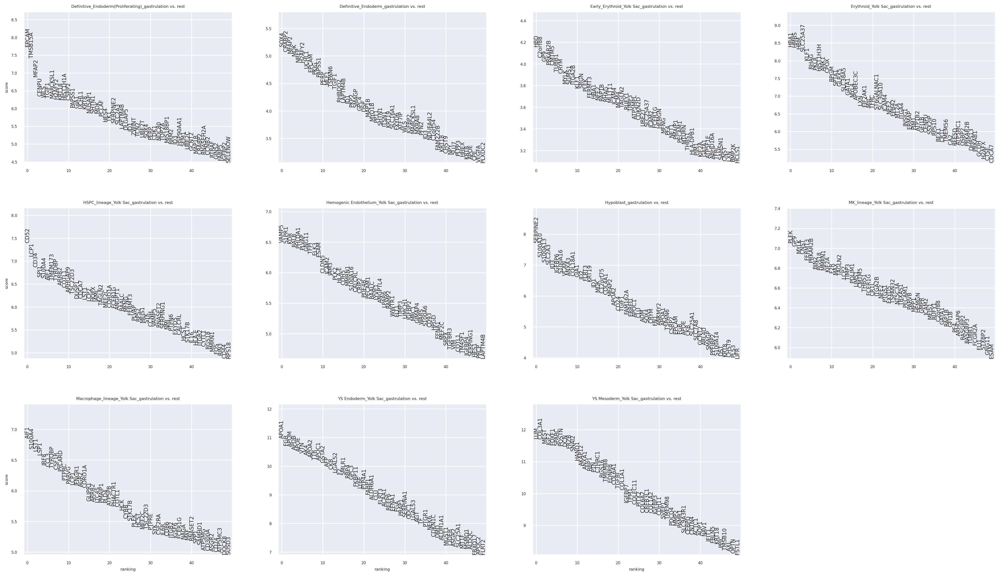

In [134]:
sc.tl.rank_genes_groups(adata, 'corr_concat', method='wilcoxon',n_genes=500)
sc.pl.rank_genes_groups(adata, n_genes=50, sharey=False)

result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
    
DE = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals','logfoldchanges']}).head(500)

DE_name ="./DEGS_gastrulation_211121.csv"
DE.to_csv(DE_name)

degs = DE[:]

if 'concat' in locals() or 'concat' in globals():
    del(concat)
n = degs.loc[:, degs.columns.str.endswith("_n")]
n = pd.melt(n)
p = degs.loc[:, degs.columns.str.endswith("_p")]
p = pd.melt(p)
l = degs.loc[:, degs.columns.str.endswith("_l")]
l = pd.melt(l)
n = n.replace(regex=r'_n', value='')

n = n.rename(columns={"variable": "cluster", "value": "gene"})
p = (p.drop(["variable"],axis = 1)).rename(columns={ "value": "p_val"})
l = (l.drop(["variable"],axis = 1)).rename(columns={ "value": "logfc"})

concat = pd.concat([n,p,l],axis=1)

#remove mito genes from data
concat = concat[~concat["gene"].str.startswith("MT-")]
concat = concat[~concat["gene"].str.startswith("RP11-")]

concat["cluster"] = concat["cluster"].astype(str)
marker_df = concat.groupby('cluster').apply(lambda grp: grp.nsmallest(5, 'p_val')).reset_index(drop=True)
markers = marker_df.groupby('cluster')['gene'].apply(list).to_dict()
markers = dict(sorted(markers.items()))
markers = {str(k):v for k,v in markers.items()}

In [135]:
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150, frameon=True, vector_friendly=True, fontsize=14, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')

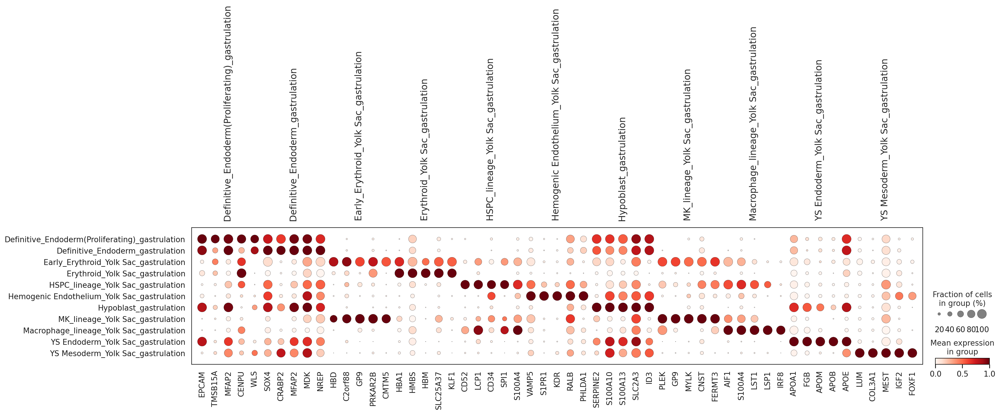

In [136]:
data_temp = adata
markers = markers
spot_var = 'corr_concat'
(sc.pl.dotplot(data_temp, var_names = markers, groupby=spot_var,dendrogram=False,standard_scale='var', color_map='Reds', show = True, save = 'diff_expression_gastrula.pdf')) # title=i


In [137]:
raw_adata = sc.read(Object2)

In [138]:
adata_raw = raw_adata[raw_adata.obs.index.isin(adata.obs.index)]
adata_raw.obs = adata.obs

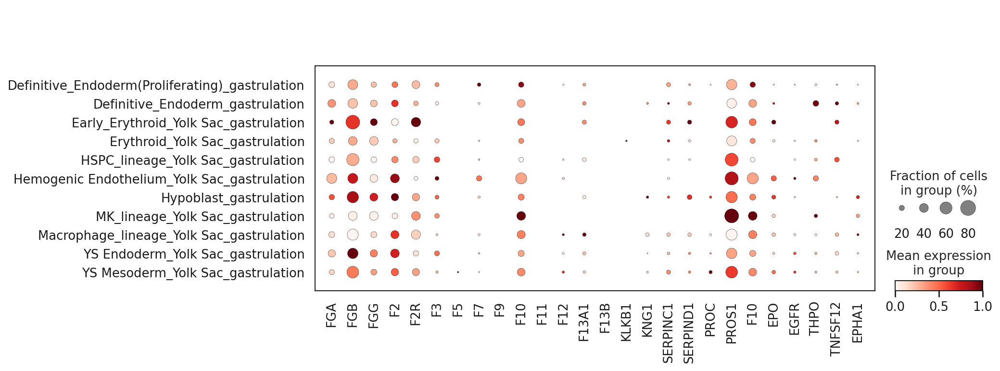

In [139]:
fig = [ 'FGA','FGB','FGG','F2','F2R','F3','F5','F7','F9','F10','F11', 'F12','F13A1','F13B','KLKB1','KNG1','SERPINC1','SERPIND1','PROC','PROS1','F10', 'EPO', 'EGFR', 'THPO', 'TNFSF12','EPHA1']

sc.pl.dotplot(adata_raw,groupby = 'corr_concat',var_names = fig,standard_scale='var',save = 'gastrula_endoderm_markers.pdf')

# Check spotplot

In [350]:
gastrula = sc.read("/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_data/gastrulation_data_human_210521/A1_V1_human_gastrulation_raw.h5ad")
gastrula = gastrula[gastrula.obs.index.isin(adata.obs.index)]
gastrula.obs = adata.obs[adata.obs.index.isin(gastrula.obs.index)]

In [367]:
#sc.pl.dotplot(gastrula,groupby = 'celltype',var_names = list(adata_ms_diff.var['mouse_human_homologs-0'][adata_ms_diff.var['mouse_human_homologs-0'].isin(fig)]),standard_scale='var',save = 'mouse_endoderm_dotplot_all_cells')
markers = ['CD9','CD37','CD53','CD63','CD81','TSPAN32','HLA-DRA','HLA-DPA1','HLA-DPB1','HLA-DMA','PLAC8','SELL','CD74','ITGA4','ITGA6','ICAM3','CD24','SPINK2','CD34','CLEC9A','MLLT3','HOPX']

In [361]:
sc.pp.normalize_per_cell(gastrula, counts_per_cell_after=None, counts_per_cell=None, key_n_counts='n_counts', copy=False, layers=(), use_rep=None, min_counts=1)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:524: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs[key_n_counts] = counts_per_cell


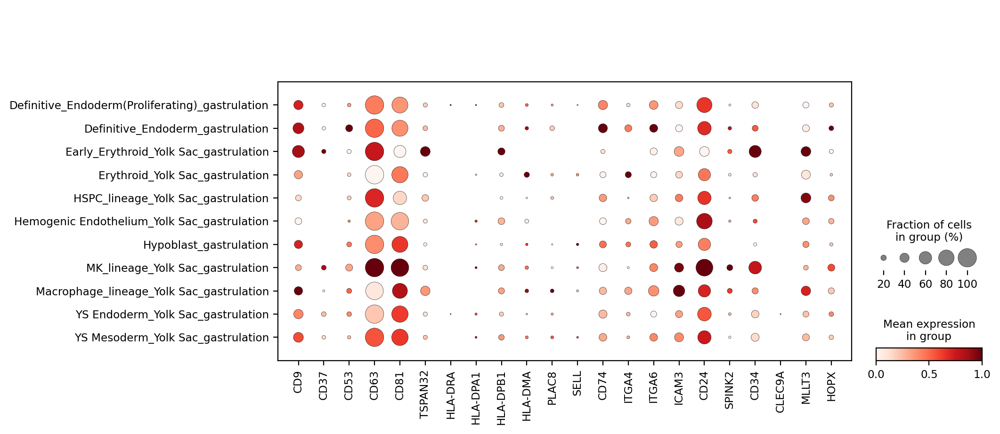

In [368]:
sc.pl.dotplot(gastrula,groupby = 'corr_concat',var_names = markers,standard_scale='var')

# FDG

In [144]:
adata = sc.read('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/LR_human_gastrulation_ys/human_gastrula_ys_integrated_211121.h5ad')

In [145]:
adata

AnnData object with n_obs × n_vars = 135059 × 2023
    obs: 'Unnamed: 0', 'X0', 'X1', 'cluster_id', 'sub_cluster', 'cluster', 'origin', 'size_factor', 'celltype_origin', 'batch', 'n_counts', 'tissue', 'lr_batch', 'corr_concat', 'cell.labels', 'stage', 'lanes', 'sex', 'sort.ids', 'fetal.ids', 'component', 'broad_cell.labels', 'sequencing.type', 'orig.dataset', 'broad_cell_labels_organ', 'V6_old_indexes', 'col', 'num', 'corr_concat_num', 'predicted', 'subclusters'
    var: 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'mt-1', 'total_counts-1', 'intersect-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'corr_concat_colors', 'corr_concat_num_colors', 'hvg', 'lr_batch_colors', 'neighbors', 'num_colors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_back', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# Use broad labels for plot

In [323]:
meta = pd.read_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/resources/A2_V7_YS_main_metadata_161121.csv',index_col = 0)

In [146]:
meta.columns

Index(['cell.labels', 'stage', 'lanes', 'sex', 'sort.ids', 'fetal.ids',
       'component', 'broad_cell.labels', 'sequencing.type', 'orig.dataset',
       'broad_cell_labels_organ', 'tissue', 'V6_old_indexes', 'V5_old_indexes',
       'corr_concat'],
      dtype='object')

In [147]:
meta['corr_concat'] = meta['broad_cell.labels'].astype(str) + '_' + 'ys'
adata.obs['corr_concat']= adata.obs['corr_concat'].astype(str) 
adata.obs.loc[adata.obs.index.isin(meta.index),'corr_concat'] = meta.loc[meta.index.isin(adata.obs.index),'corr_concat']

In [148]:
meta['corr_concat'].value_counts()

Erythroid_ys                 54849
Macrophage_ys                34399
Fibroblast_ys                19125
Endothelium_ys                5502
Smooth_Muscle_ys              4704
Endoderm_ys                   4523
Progenitors_ys                4109
MK_ys                         2154
Mesothelium_ys                1764
Microglia_ys                  1678
Monocyte_ys                    591
DC_ys                          546
Granulocyte_precursors_ys      288
Mast_cell_ys                   278
Lymphoid_ys                    255
Name: corr_concat, dtype: int64

In [149]:
sorted(list(adata.obs.loc[adata.obs['tissue'].isin(['gastrulation']),'corr_concat'].unique()))

['Definitive_Endoderm(Proliferating)_gastrulation',
 'Definitive_Endoderm_gastrulation',
 'Early_Erythroid_Yolk Sac_gastrulation',
 'Erythroid_Yolk Sac_gastrulation',
 'HSPC_lineage_Yolk Sac_gastrulation',
 'Hemogenic Endothelium_Yolk Sac_gastrulation',
 'Hypoblast_gastrulation',
 'MK_lineage_Yolk Sac_gastrulation',
 'Macrophage_lineage_Yolk Sac_gastrulation',
 'YS Endoderm_Yolk Sac_gastrulation',
 'YS Mesoderm_Yolk Sac_gastrulation']

In [150]:
sorted(list(adata.obs.loc[~adata.obs['tissue'].isin(['gastrulation']),'corr_concat'].unique()))

['DC_ys',
 'Endoderm_ys',
 'Endothelium_ys',
 'Erythroid_ys',
 'Fibroblast_ys',
 'Granulocyte_precursors_ys',
 'Lymphoid_ys',
 'MK_ys',
 'Macrophage_ys',
 'Mast_cell_ys',
 'Mesothelium_ys',
 'Microglia_ys',
 'Monocyte_ys',
 'Progenitors_ys',
 'Smooth_Muscle_ys']

In [164]:
adata = adata[adata.obs['corr_concat'].isin([
 'Early_Erythroid_Yolk Sac_gastrulation',
 'Erythroid_Yolk Sac_gastrulation',
 'HSPC_lineage_Yolk Sac_gastrulation',
 'MK_lineage_Yolk Sac_gastrulation',
 'Macrophage_lineage_Yolk Sac_gastrulation',
 'MEMP_ys',
 'HSPC_1_ys',
 'Erythroid_ys',
 'MK_ys',
 'Early_Erythroid_ys',
 'Lymphoid_progenitor_ys',
 'HSPC_2_ys',
 'Macrophage_ys',
 'Mast_cell_ys',
 'MOP_ys',
 'CMP_ys',
 'Mono Mac', 
'pre DC2_ys',
 'Monocyte_ys',
 'LMPP_ys',
 'Neutrophil_precursor_ys',
 'Microglia_ys',
 'Promonocyte_ys',
 'Eo_Baso_Mast_precursor_ys',
 'ILC_precursor_ys',
 'Pre_Macrophage_ys',
 'Eo_Basophil_ys',
 'Pre DC2_ys',
 'Monocyte_Macrophage_ys',])]

In [ ]:
sc.tl.draw_graph(adata, layout='fa')

Trying to set attribute `.uns` of view, copying.


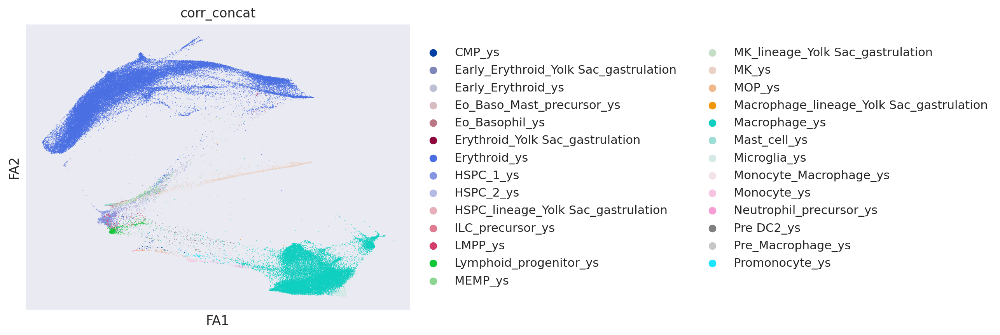

In [243]:
sc.pl.draw_graph(adata, color = 'corr_concat')

In [322]:
#adata.write('./human_gastru_ys_heam_only_prediction_211121.h5ad')
adata = sc.read('./human_gastru_ys_heam_only_prediction_211121.h5ad')

In [287]:
list(adata.obs['corr_concat'].unique())

['MK_lineage_Yolk Sac_gastrulation',
 'HSPC_lineage_Yolk Sac_gastrulation',
 'Erythroid_Yolk Sac_gastrulation',
 'Macrophage_lineage_Yolk Sac_gastrulation',
 'Early_Erythroid_Yolk Sac_gastrulation',
 'MEMP_ys',
 'HSPC_1_ys',
 'Erythroid_ys',
 'Macrophage_ys',
 'MK_ys',
 'Early_Erythroid_ys',
 'Lymphoid_progenitor_ys',
 'HSPC_2_ys',
 'Mast_cell_ys',
 'MOP_ys',
 'CMP_ys',
 'Monocyte_ys',
 'LMPP_ys',
 'Neutrophil_precursor_ys',
 'Microglia_ys',
 'Promonocyte_ys',
 'Eo_Baso_Mast_precursor_ys',
 'ILC_precursor_ys',
 'Pre_Macrophage_ys',
 'Eo_Basophil_ys',
 'Pre DC2_ys',
 'Monocyte_Macrophage_ys']

In [332]:
cells = sorted(list(adata.obs.loc[adata.obs['corr_concat'].str.contains('_gastrula'),'corr_concat'].unique()))
cells.extend(sorted(list(adata.obs.loc[~adata.obs['corr_concat'].str.contains('_gastrula'),'corr_concat'].unique())))

In [333]:
cells

['Early_Erythroid_Yolk Sac_gastrulation',
 'Erythroid_Yolk Sac_gastrulation',
 'HSPC_lineage_Yolk Sac_gastrulation',
 'MK_lineage_Yolk Sac_gastrulation',
 'Macrophage_lineage_Yolk Sac_gastrulation',
 'DC_ys',
 'Erythroid_ys',
 'Granulocyte_precursors_ys',
 'Lymphoid_ys',
 'MK_ys',
 'Macrophage_ys',
 'Mast_cell_ys',
 'Microglia_ys',
 'Monocyte_ys',
 'Progenitors_ys']

In [334]:
col_selector = pd.read_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/resources/gastru_ys_broad_cell_labels_pal_091121.csv')
col_selector = dict(zip(col_selector.iloc[:,0],col_selector.iloc[:,1]))
dic = col_selector
#Create a mappable field
adata.obs['col'] = adata.obs["corr_concat"].astype(str)
#map to adata.obs.col to create a caterorical column
adata.obs['col'] = adata.obs['col'].map(dic)
#Map to a pallete to use with umap
cells_list = pd.DataFrame(adata.obs["cell.labels"].cat.categories)
cells_list['col'] = cells_list[0].map(dic)
col_pal = list(cells_list['col'])
col_dic = dic

Trying to set attribute `.obs` of view, copying.


In [335]:
col_dic

{'Progenitors_ys': '#afbfcc',
 'Lymphoid_ys': '#e0ee71',
 'DC_ys': '#6ea85b',
 'Monocyte_ys': '#b49fc8',
 'Macrophage_ys': '#4c7bab',
 'Microglia_ys': '#1e38ad',
 'Granulocyte_precursors_ys': '#05394a',
 'Mast_cell_ys': '#b0a789',
 'MK_ys': '#ee943f',
 'Erythroid_ys': '#FFE8EC',
 'Endothelium_ys': '#d0352b',
 'Fibroblast_ys': '#b43c52',
 'Smooth_Muscle_ys': '#5c865e',
 'Mesothelium_ys': '#eccd6e',
 'Endoderm_ys': '#bd7961',
 'Early_Erythroid_Yolk Sac_gastrulation': '#63FFAC',
 'Erythroid_Yolk Sac_gastrulation': '#ff0000',
 'HSPC_lineage_Yolk Sac_gastrulation': '#94BFB1',
 'MK_lineage_Yolk Sac_gastrulation': '#EE943F',
 'Macrophage_lineage_Yolk Sac_gastrulation': '#B49EC8',
 'Hemogenic Endothelium_Yolk Sac_gastrulation': '#D0352B',
 'YS Mesoderm_Yolk Sac_gastrulation': '#ECCD6E',
 'YS Endoderm_Yolk Sac_gastrulation': '#BD7961',
 'Visceral endoderm_mouse_gastrulation': '#E0EE70',
 'Hypoblast_gastrulation': '#EE943E',
 'Definitive_Endoderm_gastrulation': '#5C865E',
 'Definitive_Endoderm(P

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'num' as categorical
/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'corr_concat_num' as categorical


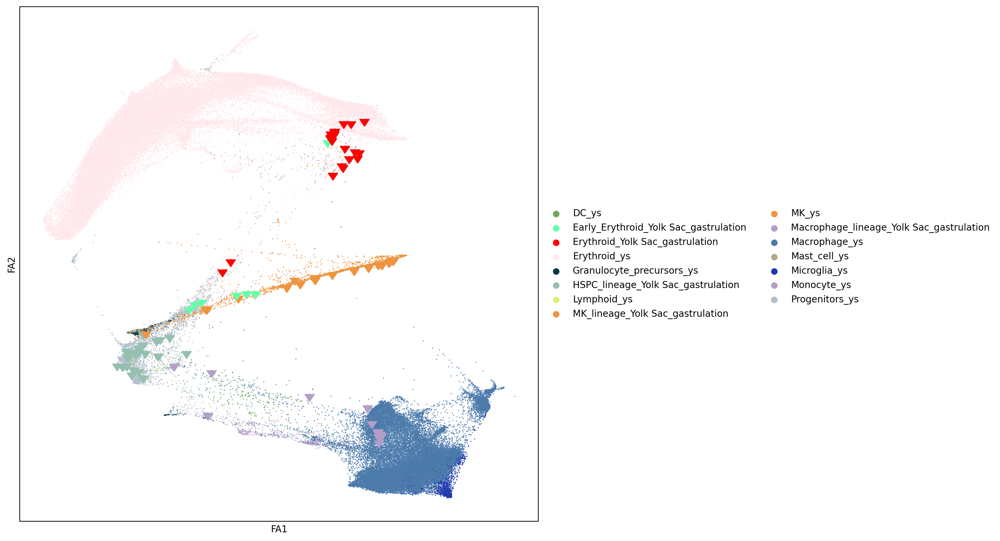

In [337]:
var = "corr_concat"
#Create color dictionary
#cells = list(adata.obs[var].unique())
#col = list(range(0,len(adata.obs[var].unique())))
#dic = dict(zip(cells,col))

#Create a mappable field
adata.obs['num'] = adata.obs[var]
#map to adata.obs.col to create a caterorical column
adata.obs['num'] = adata.obs['num'].map(dic)
#adata.obs['col'] ='#ff0000' 

##Map to a pallete to use with umap
#cells_list = pd.DataFrame(adata.obs["cell.labels"].cat.categories)
#cells_list['col'] = cells_list[0].map(dic)
#col_pal = list(cells_list['col'])
adata.obs['num'] = adata.obs['num'].astype(str)
adata.obs[var+'_num'] = adata.obs['num'].astype(str) + " : " + adata.obs[var].astype(str)

import matplotlib
matplotlib.rcdefaults() #Reset matplot lb deafults as seaborne tends to mess with this

fig, ax = plt.subplots(1,figsize=(10,10))
#p3 = sc.pl.umap(adata, color = "num",legend_loc="on data",size=10,legend_fontsize='small',ax=ax1,show=False,title="mouse_vs_human", palette= col_pal) #title=i
#p2 = ax.scatter(adata.obsm['X_umap'][:,0][adata.obs["tissue"]=="YS"], adata.obsm['X_umap'][:,1][adata.obs["tissue"]=="YS"],c=adata.obs['col'][adata.obs["tissue"]=="YS"], s=1)
p2 = sc.pl.draw_graph(adata, color = var ,ax=ax,size=5,show=False,title="",palette = col_dic) #title=i
#p4 = sc.pl.draw_graph(adata, color = 'num',legend_loc='on data',size=2,legend_fontsize='small',ax=ax,show=False, palette= col_dic) #title=i
p3 = ax.scatter(adata.obsm['X_draw_graph_fa'][:,0][adata.obs['corr_concat'].str.contains('_gastrula')], adata.obsm['X_draw_graph_fa'][:,1][adata.obs['corr_concat'].str.contains('_gastrula')],c=adata.obs['col'][adata.obs['corr_concat'].str.contains('_gastrula')], s=100,marker=11)

fig.savefig('./'+var+"_gastrula_ys_fdg.pdf",bbox_inches='tight')

# Model Coefficients
- https://www.datasklr.com/logistic-regression/multinomial-logistic-regression
-The interpretation of the exponentiated coefficients is for a single unit change in the predictor variable, the odds will be multiplied by a factor indicated by the exponent of the beta coefficient, given that all other variables are held constant.  For example, the first variable is LENGTH with a value of 0.038.  This means  that if length increases by one unit the odds of being female is 3.8% compared to the status when length did not increase by one unit. A generic output looks looks something like this (the below is based on infants!)

# Get Model prediction output ranked genes
# Add PC coeff as well
-Standardized coefficients represent the mean change in the response given a one standard deviation change in the predictor.

- plotting multinomial lr https://scikit-learn.org/dev/auto_examples/linear_model/plot_logistic_multinomial.html

In [154]:
# Export top genes for each PC loading
coeff = pd.DataFrame(model.coef_,index = lr.classes_)
df_loadings = pd.DataFrame(adata.varm['PCs'], index=adata.var_names)
df_rankings = pd.DataFrame((-1 * df_loadings.values).argsort(0).argsort(0), index=df_loadings.index, columns=df_loadings.columns)
coeff_rankings = (pd.DataFrame((-1 * coeff.T.values).argsort(0).argsort(0), index=coeff.T.index, columns=coeff.T.columns)).T

# get top loadings for each classification
# Use Cumulative distribution to determine feature importance
ranking_genes = pd.DataFrame(columns = ['class','x_pc','top_loadings','loading_val'])
for classes in coeff_rankings.index:
    print(classes)
    class_ranking = pd.DataFrame(coeff_rankings.T.loc[: , classes])
    class_ranking = class_ranking.iloc[:,0].sort_values().head(3)
    for comps in class_ranking.index:
        print(comps)
        genes = list(df_rankings[comps].sort_values().head(15).index)
        compile_classes = pd.DataFrame(columns = ranking_genes.columns)
        compile_classes.top_loadings = genes
        compile_classes.x_pc = comps
        compile_classes['class'] = classes
        compile_classes['loading_val'] = df_loadings.loc[df_loadings.index.isin(genes),comps].sort_values(ascending=False).values
        ranking_genes = pd.concat([ranking_genes,compile_classes])
        U = np.mean(df_loadings[comps])
        std = np.std(df_loadings[comps])
        med =  np.median(df_loadings[comps])
        mad = np.median(np.absolute(df_loadings[comps] - np.median(df_loadings[comps])))
        pvals = scipy.stats.norm.sf(df_loadings[comps], loc=U, scale=1*std)
        pvals = scipy.stats.norm.sf(df_loadings[comps], loc=med, scale=2*mad)
        df_loadings[str(comps) +'_pval'] = pvals

ranking_genes.to_csv('lr_features_sig.csv')
#plt.plot(coeff.iloc[0,:], coeff.iloc[0,:] + 0, '-g')
#plt.axvline(x=-0.36914894,color='blue')
#plt.axvline(x=-0.36914894,color='blue')

AEC_ys
12
8
2
CMP_ys
46
45
24
Cycling DC2_ys
47
13
40
Early_Erythroid_ys
1
3
30
Endoderm_ys
1
36
22
Eo_Baso_Mast_precursor_ys
43
21
45
Eo_Basophil_ys
21
48
49
Erythroid_ys
4
17
27
Fibroblast_ys
10
3
24
HE_ys
2
12
41
HSPC_1_ys
1
7
2
HSPC_2_ys
3
29
32
ILC_precursor_ys
9
31
1
Immature_EC_ys
2
15
18
LMPP_ys
40
43
7
Lymphoid_progenitor_ys
19
40
3
MEMP_ys
3
20
17
MK_ys
3
6
1
MOP_ys
13
35
33
Mac DC2_ys
48
0
10
Macrophage_ys
0
10
4
Mast_cell_ys
26
21
45
Mesothelium_ys
10
24
15
Microglia_ys
0
28
43
Mono Mac DC2_ys
7
10
47
Mono Mac pre DC2_ys
26
7
35
Monocyte_Macrophage_ys
13
40
38
Monocyte_ys
11
13
9
NK_ys
41
19
27
Neutrophil_precursor_ys
13
10
11
Pre DC2_ys
30
37
7
Pre_Macrophage_ys
0
43
22
Prolif_AEC_ys
12
5
49
Prolif_Sinusoidal_EC_ys
5
10
2
Promonocyte_ys
11
0
13
Sinusoidal_EC_ys
0
2
45
Smooth_Muscle_ys
10
3
24
VWF_EC_ys
20
2
19
pDC precursor_ys
34
37
19


# Plot these genes

In [157]:
ranking_genes.groupby(['class','x_pc']).head(5)
ranking_genes.groupby(['class','x_pc']).tail(5)

,class,x_pc,top_loadings,loading_val
10,AEC_ys,12,DLL4,0.101748
11,AEC_ys,12,SYNPO,0.100828
12,AEC_ys,12,LTBP4,0.100388
13,AEC_ys,12,TNFSF10,0.097414
14,AEC_ys,12,CXCR4,0.091071
...,...,...,...,...
10,pDC precursor_ys,19,NR4A2,0.069793
11,pDC precursor_ys,19,AREG,0.068929
12,pDC precursor_ys,19,LSP1,0.064340
13,pDC precursor_ys,19,IFITM1,0.060749


In [281]:
rank = pd.concat([ranking_genes.groupby(['class','x_pc']).head(3),ranking_genes.groupby(['class','x_pc']).tail(3)])
plot_genes =  rank.groupby(['class'])['top_loadings'].agg(lambda grp: list(grp)).to_dict()

# Only use classes with >20% probability

In [333]:
trim = 20
train_label = adata.obs[common_cat].values
predict_label = train_label[subset_predict]
X, y = load_iris(return_X_y=True)
clf = LogisticRegression(random_state=0).fit(X, y)
clf.predict(X[:2, :])
clf.score(X, y)
pred_out = pd.DataFrame(model.predict(predict_x),columns = ['predicted'],index = adata.obs.index[adata.obs[common_cat].isin(group2)])
pred_out['orig_labels'] = predict_label
proba = pd.DataFrame(model.predict_proba(predict_x),columns = lr.classes_,index = adata.obs.index[adata.obs[common_cat].isin(group2)])
pred_out = pred_out.join(proba)
pred_out
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').mean()
#model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').median()
model_mean_probs = model_mean_probs*100
model_mean_probs = model_mean_probs.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
crs_tbl = model_mean_probs.copy()
# Keep only predictions with probs >20
crs_tbl = crs_tbl[crs_tbl.columns[crs_tbl.max() > trim]]
# Keep only predicted labels with probs >20
#crs_tbl = crs_tbl[crs_tbl.max(axis=1) > trim]
# Sort df columns by rows
#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
#crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.columns), axis=0,ascending=False)
index_order = list(crs_tbl.max(axis=1).sort_values(ascending=False).index)
col_order = list(crs_tbl.max(axis=0).sort_values(ascending=False).index)
crs_tbl = crs_tbl.loc[index_order]
crs_tbl = crs_tbl[col_order]

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [363]:
rank = pd.concat([ranking_genes.groupby(['class','x_pc']).head(3),ranking_genes.groupby(['class','x_pc']).tail(3)])
rank = rank[rank['class'].isin(list(crs_tbl.columns))]
plot_genes =  rank.groupby(['class'])['top_loadings'].agg(lambda grp: list(grp)).to_dict()

In [371]:
genes = [k for i,j in plot_genes.items() for k in j if k]

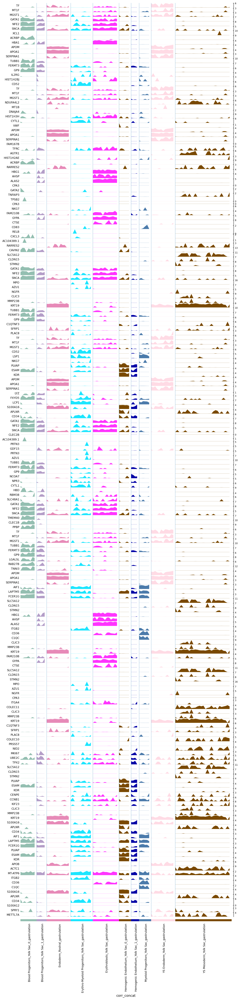

In [372]:
predict_grp = adata[adata.obs[common_cat].isin(group2)]
counts = (pd.DataFrame(predict_grp.obs['predicted'].value_counts()))
#predict_grp = predict_grp[predict_grp.obs.index.isin(predict_grp.obs.groupby('predicted').head(100).index)]
sc.pl.tracksplot(predict_grp, var_names = genes, groupby='corr_concat', dendrogram=False,save = 'trackspot',var_group_labels = list(plot_genes.keys()))

In [346]:
ranking_genes.to_csv('./lr_sig_feature_usage.csv')

In [347]:
ranking_genes

,class,x_pc,top_loadings,loading_val
0,AEC_ys,12,GJA5,0.227206
1,AEC_ys,12,IL33,0.209587
2,AEC_ys,12,PALMD,0.185377
3,AEC_ys,12,TMEM100,0.184172
4,AEC_ys,12,MECOM,0.142402
...,...,...,...,...
10,pDC precursor_ys,19,NR4A2,0.069793
11,pDC precursor_ys,19,AREG,0.068929
12,pDC precursor_ys,19,LSP1,0.064340
13,pDC precursor_ys,19,IFITM1,0.060749


In [373]:
ranking_genes

,class,x_pc,top_loadings,loading_val
0,AEC_ys,12,GJA5,0.227206
1,AEC_ys,12,IL33,0.209587
2,AEC_ys,12,PALMD,0.185377
3,AEC_ys,12,TMEM100,0.184172
4,AEC_ys,12,MECOM,0.142402
...,...,...,...,...
10,pDC precursor_ys,19,NR4A2,0.069793
11,pDC precursor_ys,19,AREG,0.068929
12,pDC precursor_ys,19,LSP1,0.064340
13,pDC precursor_ys,19,IFITM1,0.060749


# Get genes conserved between species and differential expression within combined embedding for single classes of cells

In [163]:
# Get conserved expression
save = 'endoderm_mouse_human_conserved.csv'
celltypes = ['ExE endoderm_4_mouse_gastrulation','Endoderm_ys']
celltype_rank = ranking_genes[ranking_genes['class'].isin(celltypes)]
celltype_rank.columns = ['cluster','xpca','gene','logfc']
celltype_rank.to_csv(save)

In [164]:
celltype_rank

,cluster,xpca,gene,logfc
0,Endoderm_ys,1,TF,0.069537
1,Endoderm_ys,1,MT1F,0.069079
2,Endoderm_ys,1,MGST1,0.068919
3,Endoderm_ys,1,FGB,0.068411
4,Endoderm_ys,1,RBP4,0.067477
5,Endoderm_ys,1,AHSG,0.066329
6,Endoderm_ys,1,AGT,0.066021
7,Endoderm_ys,1,SMLR1,0.065774
8,Endoderm_ys,1,MT1G,0.065634
9,Endoderm_ys,1,MT1E,0.065622


In [ ]:
# Get differential
key_add = 'de_unclust'
adata.obs[key_add] = adata.obs['corr_concat'].astype(str)
adata.obs.loc[adata.obs['species'].isin(['Mouse']),key_add]  = adata.obs.loc[adata.obs['species'].isin(['Mouse']),key_add].str.replace('_\d+_','_').astype(str)
list(adata.obs.loc[adata.obs['species'].isin(['Mouse']),key_add].unique())

In [ ]:
keep_classes = ['ExE endoderm_mouse_gastrulation','Endoderm_ys']
adata_deg = adata[adata.obs[key_add].isin(keep_classes)]

sc.tl.rank_genes_groups(adata_deg, key_add, method='wilcoxon',groups=keep_classes,n_genes=500)
sc.pl.rank_genes_groups(adata_deg, n_genes=50, sharey=False)

result = adata_deg.uns['rank_genes_groups']
groups = result['names'].dtype.names
    
DE = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals','logfoldchanges']}).head(500)

DE_name ="./mouse_human_endoderm"
DE.to_csv(DE_name)

In [ ]:
U = np.mean(df_loadings[comps])
std = np.std(df_loadings[comps])
med =  np.median(df_loadings[comps])
mad = np.median(np.absolute(df_loadings[comps] - np.median(df_loadings[comps])))
pvals = scipy.stats.norm.sf(df_loadings[comps], loc=med, scale=2*mad)
#pvals = scipy.stats.norm.sf(df_loadings[comps], loc=U, scale=1*std)
df_loadings[str(comps) +'_pval'] = pvals
plt.hist(df_loadings[comps])
for i in ((df_loadings[comps][df_loadings[str(comps) +'_pval']<0.05]).unique()):
    plt.axvline(x=i,color='red')
plt.axvline(x=med,color='blue')
#plt.axvline(x=med,color='pink')
df_loadings[comps][df_loadings[str(comps) +'_pval']<0.05]
print(len(df_loadings[comps][df_loadings[str(comps) +'_pval']<0.05]))
#Plot precision recall and recall
plot_loading = pd.DataFrame(pd.DataFrame(df_loadings[comps][df_loadings[str(comps) +'_pval']<0.05]).iloc[:,0].sort_values())
table = plt.table(cellText=plot_loading.values,colWidths = [1]*len(plot_loading.columns),
rowLabels=plot_loading.index,
colLabels=plot_loading.columns,
cellLoc = 'center', rowLoc = 'center',
loc='right', bbox=[1.2, -0.05, 0.5,1])
table.scale(1, 2)
table.set_fontsize(16)

In [ ]:
# make 3-class dataset for classification
centers = [[-5, 0], [0, 1.5], [5, -1]]
X, y = make_blobs(n_samples=1000, centers=centers, random_state=40)
transformation = [[0.4, 0.2], [-0.4, 1.2]]
X = np.dot(X, transformation)

# Marker gene overlap to rank conserved genes

### Calculate an overlap score between data-deriven marker genes and provided markers 
### Marker gene overlap scores can be quoted as overlap counts, overlap coefficients, or jaccard indices. The method returns a pandas dataframe which can be used to annotate clusters based on marker gene overlaps.

In [ ]:
# Grab marker genes that overlap between top gene loadings in each PCA used for predictions

In [ ]:
scanpy.tl.marker_gene_overlap(adata, reference_markers, *, key='rank_genes_groups', method='overlap_count', normalize=None, top_n_markers=None, adj_pval_threshold=None, key_added='marker_gene_overlap', inplace=False)

# Regress out effect of gene predictions dervied from PCA

In [ ]:
dc_class = ranking_genes[ranking_genes['class'].isin(['DC_YS_main_training'])]

pca = pd.DataFrame(adata.obsm['X_pca'])
regress_ind = list(dc_class['x_pc'].unique())
regress_ind_obs = pca[regress_ind]
regress_ind = ['regress-pc_' + str(s) for s in regress_ind]
regress_ind_obs.columns = regress_ind
adata.obs[regress_ind] = regress_ind_obs.values
adata.obs[regress_ind]
sc.pp.regress_out(adata,keys = regress_ind)

# make some fdgs

In [378]:
cells

['YS Mesoderm_Yolk Sac_gastrulation',
 'YS Endoderm_Yolk Sac_gastrulation',
 'Erythro-Myeloid Progenitors_Yolk Sac_gastrulation',
 'Endoderm_Rostral_gastrulation',
 'Erythroblasts_Yolk Sac_gastrulation',
 'Hemogenic Endothelium_Yolk Sac_0_gastrulation',
 'Blood Progenitors_Yolk Sac_0_gastrulation',
 'Blood Progenitors_Yolk Sac_1_gastrulation',
 'Myeloid Progenitors_Yolk Sac_gastrulation',
 'Hemogenic Endothelium_Yolk Sac_1_gastrulation',
 'Sinusoidal_EC_ys',
 'MEMP_ys',
 'HSPC_1_ys',
 'Erythroid_ys',
 'Endoderm_ys',
 'Immature_EC_ys',
 'MK_ys',
 'Early_Erythroid_ys',
 'Lymphoid_progenitor_ys',
 'Mesothelium_ys',
 'Prolif_Sinusoidal_EC_ys',
 'Fibroblast_ys',
 'HSPC_2_ys',
 'Macrophage_ys',
 'AEC_ys',
 'Mast_cell_ys',
 'MOP_ys',
 'CMP_ys',
 'Mono Mac pre DC2_ys',
 'HE_ys',
 'Monocyte_ys',
 'LMPP_ys',
 'Neutrophil_precursor_ys',
 'Microglia_ys',
 'Smooth_Muscle_ys',
 'Promonocyte_ys',
 'Eo_Baso_Mast_precursor_ys',
 'ILC_precursor_ys',
 'Pre_Macrophage_ys',
 'VWF_EC_ys',
 'Eo_Basophil_ys',

In [384]:
gastru = adata[adata.obs['corr_concat'].isin([
 'Erythro-Myeloid Progenitors_Yolk Sac_gastrulation',
 'Erythroblasts_Yolk Sac_gastrulation',
 'Hemogenic Endothelium_Yolk Sac_0_gastrulation',
 'Blood Progenitors_Yolk Sac_0_gastrulation',
 'Blood Progenitors_Yolk Sac_1_gastrulation',
 'Myeloid Progenitors_Yolk Sac_gastrulation',
 'Hemogenic Endothelium_Yolk Sac_1_gastrulation',
 'MEMP_ys',
 'HSPC_1_ys',
 'Erythroid_ys',
 'MK_ys',
 'Early_Erythroid_ys',
 'Lymphoid_progenitor_ys',
 'HSPC_2_ys',
 'Macrophage_ys',
 'Mast_cell_ys',
 'MOP_ys',
 'CMP_ys',
 'Mono Mac', 
'pre DC2_ys',
 'Monocyte_ys',
 'LMPP_ys',
 'Neutrophil_precursor_ys',
 'Microglia_ys',
 'Promonocyte_ys',
 'Eo_Baso_Mast_precursor_ys',
 'ILC_precursor_ys',
 'Pre_Macrophage_ys',
 'Eo_Basophil_ys',
 'Pre DC2_ys',
 'Monocyte_Macrophage_ys',])]

In [385]:
sc.tl.draw_graph(gastru, layout='fa')

drawing single-cell graph using layout 'fa'


Trying to set attribute `.uns` of view, copying.


    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:03:06)


In [405]:
adata = adata[adata.obs['corr_concat'].isin([
 'Erythro-Myeloid Progenitors_Yolk Sac_gastrulation',
 'Erythroblasts_Yolk Sac_gastrulation',
 'Blood Progenitors_Yolk Sac_0_gastrulation',
 'Blood Progenitors_Yolk Sac_1_gastrulation',
 'Myeloid Progenitors_Yolk Sac_gastrulation',
 'MEMP_ys',
 'HSPC_1_ys',
 'Erythroid_ys',
 'MK_ys',
 'Early_Erythroid_ys',
 'Lymphoid_progenitor_ys',
 'HSPC_2_ys',
 'Macrophage_ys',
 'Mast_cell_ys',
 'MOP_ys',
 'CMP_ys',
 'Mono Mac', 
'pre DC2_ys',
 'Monocyte_ys',
 'LMPP_ys',
 'Neutrophil_precursor_ys',
 'Microglia_ys',
 'Promonocyte_ys',
 'Eo_Baso_Mast_precursor_ys',
 'ILC_precursor_ys',
 'Pre_Macrophage_ys',
 'Eo_Basophil_ys',
 'Pre DC2_ys',
 'Monocyte_Macrophage_ys',])]

Trying to set attribute `.obs` of view, copying.
/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'num' as categorical
/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'corr_concat_num' as categorical


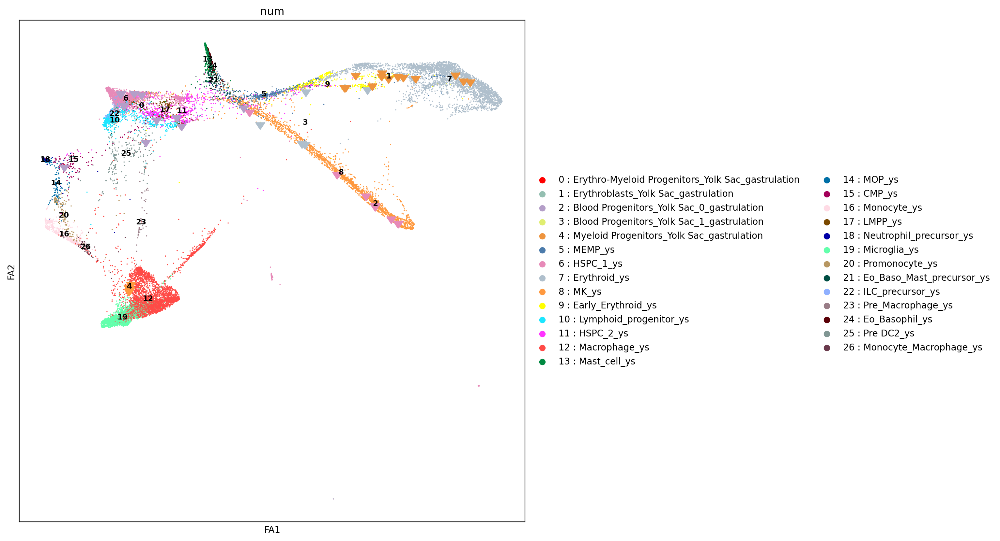

In [406]:
var = "corr_concat"
#Create color dictionary
cells = list(adata.obs[var].unique())
col = list(range(0,len(adata.obs[var].unique())))
dic = dict(zip(cells,col))

#Create a mappable field
adata.obs['num'] = adata.obs[var]
#map to adata.obs.col to create a caterorical column
adata.obs['num'] = adata.obs['num'].map(dic)
#adata.obs['col'] ='#ff0000' 

##Map to a pallete to use with umap
#cells_list = pd.DataFrame(adata.obs["cell.labels"].cat.categories)
#cells_list['col'] = cells_list[0].map(dic)
#col_pal = list(cells_list['col'])
adata.obs['num'] = adata.obs['num'].astype(str)
adata.obs[var+'_num'] = adata.obs['num'].astype(str) + " : " + adata.obs[var].astype(str)

col_pal_ys = ['#ff0000',    '#94BFB1',    '#B49EC8',    '#E0EE70',    '#EE943E',    '#4C7BAB',    '#E78AB8',    '#AFBFCC',    '#FF993F',    "#FFFF00", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059",    "#FFDBE5", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",    "#5A0007", "#809693", "#6A3A4C", "#1B4400", "#4FC601", "#3B5DFF"]

import matplotlib
matplotlib.rcdefaults() #Reset matplot lb deafults as seaborne tends to mess with this

fig, ax = plt.subplots(1,figsize=(10,10))
#p3 = sc.pl.umap(adata, color = "num",legend_loc="on data",size=10,legend_fontsize='small',ax=ax1,show=False,title="mouse_vs_human", palette= col_pal) #title=i
#p2 = ax.scatter(adata.obsm['X_umap'][:,0][adata.obs["tissue"]=="YS"], adata.obsm['X_umap'][:,1][adata.obs["tissue"]=="YS"],c=adata.obs['col'][adata.obs["tissue"]=="YS"], s=1)
p2 = sc.pl.draw_graph(adata, color = (var+'_num') ,ax=ax,show=False,title="",palette = list(col_dic.values())) #title=i
p4 = sc.pl.draw_graph(adata, color = 'num',legend_loc='on data',size=2,legend_fontsize='small',ax=ax,show=False, palette= list(col_dic.values())) #title=i
p3 = ax.scatter(adata.obsm['X_draw_graph_fa'][:,0][adata.obs["tissue"]=="gastrulation"], adata.obsm['X_draw_graph_fa'][:,1][adata.obs["tissue"]=="gastrulation"],c=adata.obs['col'][adata.obs["tissue"]=="gastrulation"], s=100,marker=11)

fig.savefig('./'+var+"_gastrula_ys_fdg.pdf",bbox_inches='tight')